# Time Series Analysis

Import library and dataset:

In [231]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import zlib
import math
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.metrics import pairwise_distances
from tslearn.metrics import dtw_path as dtw
from sklearn.cluster import AgglomerativeClustering
from tslearn.piecewise import PiecewiseAggregateApproximation
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import euclidean
from plot_utils import sankey_plot
from matrixprofile import *
from matrixprofile.discords import discords
from tslearn.shapelets import ShapeletModel
from tslearn.shapelets import grabocka_params_to_shapelet_size_dict
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [232]:
incidents_df = pd.read_csv(
    '../data/incidents_cleaned.csv',
    parse_dates=['date', 'date_original'],
    date_parser=lambda x: pd.to_datetime(x, format='%Y-%m-%d')
)
incidents_df.drop_duplicates(inplace=True)

# drop rows where year is outside of 2014-2017
incidents_df = incidents_df[incidents_df['year'].between(2014, 2017)]

In [233]:
incidents_df.head(2)

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,...,defensive,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010
0,2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,...,False,False,False,False,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802
1,2017-04-03,2017-04-03,2017.0,4,3,0,PENNSYLVANIA,5647 US 6,41.6645,-78.7856,...,False,False,False,False,10.5,REPUBLICAN,206761.0,307843.0,67.164431,12702379


We use only data corresponding to incidents in 2014, 2015, 2016 or 2017. 

In [234]:
incidents_df['year'].unique()

array([2015., 2017., 2016., 2014.])

In [235]:
pd.to_datetime('2014-1-1', format='%Y-%m-%d').day_name()

'Wednesday'

In [236]:
pd.to_datetime('2014-1-6', format='%Y-%m-%d').day_name()

'Monday'

In [237]:
pd.to_datetime('2017-12-31', format='%Y-%m-%d').day_name()

'Sunday'

We extract a time series for each city, computing a value for each week of the 4 years a score.

Weeks are numbered from 0. The first week has 2 days less than the others.

6th January 2014 is Monday and belongs to week 1 (the second).

31th December 2017 is Sunday and belongs to week 208 (last one).

In [238]:
# Add columns week number, start from 0 for the first week of 2014
incidents_df['week'] = (incidents_df['date'] - pd.to_datetime('2013-12-30')).dt.days // 7

In [239]:
# number of weeks in the dataset
incidents_df['week'].max()

208

In [240]:
print('Number of weeks in the dataset: ', incidents_df['week'].max()+1)
print('Number of weeks of 7 days expected: ', ((365*4+1) - 5 ) / 7) # ok :)

Number of weeks in the dataset:  209
Number of weeks of 7 days expected:  208.0


In [241]:
incidents_df['week'].unique().shape # all weeks are present

(209,)

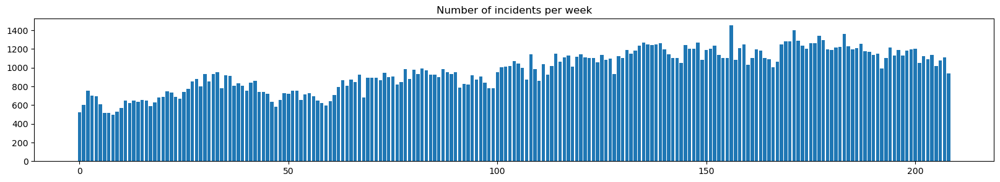

In [242]:
# group by week and count incidents
plt.figure(figsize=(20, 3))
plt.bar(
    incidents_df.groupby('week').size().index,
    incidents_df.groupby('week').size().values
)
plt.title('Number of incidents per week');

Group incidents by City and Week

In [243]:
# group by wee, city and state
incidents_df.groupby(['week', 'city', 'state']).count()

date  date_original  year  \
week city                       state                                       
0    Albany                     GEORGIA            1              1     1   
     Albuquerque                NEW MEXICO         1              1     1   
     Allentown                  PENNSYLVANIA       1              1     1   
     Altoona                    IOWA               1              1     1   
     Amarillo                   TEXAS              1              1     1   
...                                              ...            ...   ...   
208  Winnsboro                  SOUTH CAROLINA     1              1     1   
     Yakima                     WASHINGTON         4              4     4   
     York                       PENNSYLVANIA       1              1     1   
     Youngstown                 OHIO               3              3     3   
     Ypsilanti Charter Township MICHIGAN           1              1     1   

                                                month  day  day_of_week  \
week city                       state                                     
0    Albany                     GEORGIA             1    1            1   
     Albuquerque                NEW MEXICO          1    1            1   
     Allentown                  PENNSYLVANIA        1    1            1   
     Altoona                    IOWA                1    1            1   
     Amarillo                   TEXAS               1    1            1   
...                                               ...  ...          ...   
208  Winnsboro                  SOUTH CAROLINA      1    1            1   
     Yakima                     WASHINGTON          4    4            4   
     York                       PENNSYLVANIA        1    1            1   
     Youngstown                 OHIO                3    3            3   
     Ypsilanti Charter Township MICHIGAN            1    1            1   

                                                address  latitude  longitude  \
week city                       state                                          
0    Albany                     GEORGIA               1         1          1   
     Albuquerque                NEW MEXICO            1         1          1   
     Allentown                  PENNSYLVANIA          1         1          1   
     Altoona                    IOWA                  0         1          1   
     Amarillo                   TEXAS                 1         1          1   
...                                                 ...       ...        ...   
208  Winnsboro                  SOUTH CAROLINA        1         1          1   
     Yakima                     WASHINGTON            4         4          4   
     York                       PENNSYLVANIA          1         1          1   
     Youngstown                 OHIO                  2         3          3   
     Ypsilanti Charter Township MICHIGAN              1         1          1   

                                                county  ...  defensive  \
week city                       state                   ...              
0    Albany                     GEORGIA              1  ...          1   
     Albuquerque                NEW MEXICO           1  ...          1   
     Allentown                  PENNSYLVANIA         1  ...          1   
     Altoona                    IOWA                 1  ...          1   
     Amarillo                   TEXAS                1  ...          1   
...                                                ...  ...        ...   
208  Winnsboro                  SOUTH CAROLINA       1  ...          1   
     Yakima                     WASHINGTON           4  ...          4   
     York                       PENNSYLVANIA         1  ...          1   
     Youngstown                 OHIO                 3  ...          3   
     Ypsilanti Charter Township MICHIGAN             1  ...          1   

                                                workplace  abducti

We consider only cities with a number of weeks with incidents greater than 15% of the total number of the weeks of the 4 years.

In [244]:
0.15 * 209 # consider only cities with incidents in more than 30 weeks

31.349999999999998

In [245]:
incidents_df.groupby(['city', 'state'])['week'].count() # 10200 distinct cities

city         state         
Abbeville    ALABAMA            2
             GEORGIA            1
             LOUISIANA         15
             SOUTH CAROLINA     2
Abbotsford   WISCONSIN          1
                               ..
Zionsville   INDIANA            5
Zumbrota     MINNESOTA          1
Zuni         COLORADO           4
Zuni Pueblo  NEW MEXICO         1
Zwolle       LOUISIANA          1
Name: week, Length: 10200, dtype: int64

We drop incidents with NaN values for n_oarticpants (i.e. incidents where we don not know the nember of participants).

In [246]:
# drop incidents where n_participants is nan
incidents_df = incidents_df[~incidents_df['n_participants'].isna()]

In [247]:
(incidents_df.groupby(['city', 'state'])['week'].count() > 30).to_list().count(True) # 588 cities with incidents in more than 30 weeks

588

In [248]:
# list of index of incidents in city with incidents in more than 30 weeks
index_list = np.where(incidents_df.groupby(['city', 'state'])['week'].transform('count') > 30)

In [249]:
# create a df with incidents_df where index is in index_list
incidents_df = incidents_df.iloc[index_list]
incidents_df.head(2)

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,...,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010,week
0,2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,...,False,False,False,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802,69
2,2016-11-05,2016-11-05,2016.0,11,5,5,MICHIGAN,6200 Block of East McNichols Road,42.4190,-83.0393,...,False,False,False,11.0,DEMOCRAT,244135.0,310974.0,78.506563,9883640,148


In [250]:
incidents_df.groupby(['week', 'city', 'state']).count()

date  date_original  year  \
week city                       state                                       
0    Albany                     GEORGIA            1              1     1   
     Albuquerque                NEW MEXICO         1              1     1   
     Allentown                  PENNSYLVANIA       1              1     1   
     Amarillo                   TEXAS              1              1     1   
     Anchorage                  ALASKA             2              2     2   
...                                              ...            ...   ...   
208  Wilmington                 NORTH CAROLINA     1              1     1   
     Yakima                     WASHINGTON         4              4     4   
     York                       PENNSYLVANIA       1              1     1   
     Youngstown                 OHIO               1              1     1   
     Ypsilanti Charter Township MICHIGAN           1              1     1   

                                                month  day  day_of_week  \
week city                       state                                     
0    Albany                     GEORGIA             1    1            1   
     Albuquerque                NEW MEXICO          1    1            1   
     Allentown                  PENNSYLVANIA        1    1            1   
     Amarillo                   TEXAS               1    1            1   
     Anchorage                  ALASKA              2    2            2   
...                                               ...  ...          ...   
208  Wilmington                 NORTH CAROLINA      1    1            1   
     Yakima                     WASHINGTON          4    4            4   
     York                       PENNSYLVANIA        1    1            1   
     Youngstown                 OHIO                1    1            1   
     Ypsilanti Charter Township MICHIGAN            1    1            1   

                                                address  latitude  longitude  \
week city                       state                                          
0    Albany                     GEORGIA               1         1          1   
     Albuquerque                NEW MEXICO            1         1          1   
     Allentown                  PENNSYLVANIA          1         1          1   
     Amarillo                   TEXAS                 1         1          1   
     Anchorage                  ALASKA                2         2          2   
...                                                 ...       ...        ...   
208  Wilmington                 NORTH CAROLINA        1         1          1   
     Yakima                     WASHINGTON            4         4          4   
     York                       PENNSYLVANIA          1         1          1   
     Youngstown                 OHIO                  0         1          1   
     Ypsilanti Charter Township MICHIGAN              1         1          1   

                                                county  ...  defensive  \
week city                       state                   ...              
0    Albany                     GEORGIA              1  ...          1   
     Albuquerque                NEW MEXICO           1  ...          1   
     Allentown                  PENNSYLVANIA         1  ...          1   
     Amarillo                   TEXAS                1  ...          1   
     Anchorage                  ALASKA               2  ...          2   
...                                                ...  ...        ...   
208  Wilmington                 NORTH CAROLINA       1  ...          1   
     Yakima                     WASHINGTON           4  ...          4   
     York                       PENNSYLVANIA         1  ...          1   
     Youngstown                 OHIO                 1  ...          1   
     Ypsilanti Charter Township MICHIGAN             1  ...          1   

                                                workplace  abducti

In [251]:
incidents_df['state'].unique().shape # 51: all states are present

(51,)

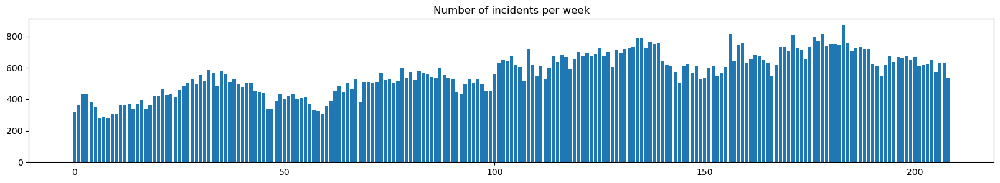

In [252]:
# group by week and count incidents
plt.figure(figsize=(20, 3))
plt.bar(
    incidents_df.groupby('week').size().index,
    incidents_df.groupby('week').size().values
)
plt.title('Number of incidents per week');

In [253]:
# number of incidents in which n_killed is nan
incidents_df[incidents_df['n_killed'].isna()].shape[0] # 0

0

## Create Time series

We create time series model each city as a sequence of incidents.

In [254]:
# Model each city as a sequence of incidents
incidents_df.groupby(['city', 'state'])['week'].count().sort_values(ascending=False) # 664 time series

city              state       
Chicago           ILLINOIS        10217
City of New York  NEW YORK         3092
Baltimore         MARYLAND         2790
New Orleans       LOUISIANA        2463
Philadelphia      PENNSYLVANIA     2400
                                  ...  
Inkster           MICHIGAN           31
Kissimmee         FLORIDA            31
Crestview         FLORIDA            31
Carlsbad          NEW MEXICO         31
Grenada           MISSISSIPPI        31
Name: week, Length: 588, dtype: int64

We create time series that rappresent the mean number of participants per incident per week in each city.

The time series assumes value 0 if we have no incidents in the week.

In [255]:
# create a dataset with series of mean number of participants per incident per week in each city
incidents_by_city_df = incidents_df.groupby(['city', 'state', 'week'])['n_participants'].mean().reset_index()
incidents_by_city_df = incidents_by_city_df.pivot(index=['city', 'state'], columns='week', values='n_participants')
incidents_by_city_df = incidents_by_city_df.fillna(0) # substitute NaN with 0
incidents_by_city_df

week                                       0    1    2    3    4    5    6    \
city                       state                                               
Abilene                    TEXAS           0.0  0.0  0.0  2.0  0.0  0.0  0.0   
Aiken                      SOUTH CAROLINA  0.0  4.0  0.0  0.0  0.0  0.0  0.0   
Akron                      OHIO            0.0  0.0  0.0  2.5  0.0  0.0  0.0   
Albany                     GEORGIA         1.0  0.0  1.0  0.0  0.0  0.0  0.0   
                           OREGON          0.0  0.0  0.0  0.0  0.0  0.0  0.0   
...                                        ...  ...  ...  ...  ...  ...  ...   
York                       PENNSYLVANIA    0.0  0.0  0.0  0.0  0.0  1.0  1.0   
Youngstown                 OHIO            0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Ypsilanti                  MICHIGAN        0.0  0.0  2.0  5.0  0.0  0.0  0.0   
Ypsilanti Charter Township MICHIGAN        0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Yuma                       ARIZONA         0.0  2.0  0.0  0.0  0.0  2.0  0.0   

week                                       7    8    9    ...       199  \
city                       state                          ...             
Abilene                    TEXAS           0.0  0.0  0.0  ...  0.000000   
Aiken                      SOUTH CAROLINA  0.0  0.0  2.0  ...  3.000000   
Akron                      OHIO            0.0  0.0  3.0  ...  1.000000   
Albany                     GEORGIA         0.0  0.0  0.0  ...  1.333333   
                           OREGON          0.0  0.0  0.0  ...  0.000000   
...                                        ...  ...  ...  ...       ...   
York                       PENNSYLVANIA    0.0  1.0  0.0  ...  1.000000   
Youngstown                 OHIO            0.0  0.0  0.0  ...  1.333333   
Ypsilanti                  MICHIGAN        0.0  0.0  0.0  ...  0.000000   
Ypsilanti Charter Township MICHIGAN        0.0  0.0  0.0  ...  0.000000   
Yuma                       ARIZONA         0.0  0.0  1.0  ...  2.000000   

week                                            200       201       202  \
city                       state                                          
Abilene                    TEXAS           0.000000  0.000000  0.000000   
Aiken                      SOUTH CAROLINA  2.000000  0.000000  2.000000   
Akron                      OHIO            2.000000  0.000000  1.500000   
Albany                     GEORGIA         0.000000  6.000000  0.000000   
                           OREGON          0.000000  0.000000  0.000000   
...                                             ...       ...       ...   
York                       PENNSYLVANIA    1.333333  1.666667  1.500000   
Youngstown                 OHIO            2.000000  1.333333  1.333333   
Ypsilanti                  MICHIGAN        0.000000  0.000000  0.000000   
Ypsilanti Charter Township MICHIGAN        0.000000  0.000000  0.000000   
Yuma                       ARIZONA         0.000000  0.000000  0.000000   

week                                            203   204   205  206  207  \
city                       state                                            
Abilene                    TEXAS           0.000000  0.00  0.00  0.0  1.0   
Aiken                      SOUTH CAROLINA  0.000000  1.00  1.50  0.0  1.5   
Akron                      OHIO            1.000000  1.00  1.75  1.5  2.5   
Albany                     GEORGIA         0.000000  0.00  0.00  0.0  0.0   
                           OREGON          0.000000  0.00  0.00  0.0  0.0   
...                                             ...   ...   ...  ...  ...   
York                       PENNSYLVANIA    1.000000  1.00  0.00  1.5  2.0   
Youngstown                 OHIO            1.666667  1.75  2.00  1.0  1.0   
Ypsilanti                  MICHIGAN        1.000000  0.00  0.00  0.0  0.0   
Ypsilanti Charter Township MICHIGAN        1.000000  0.00  0.00  0.0  0.0   
Yuma                       ARIZONA         0.000000  2.00  0.00  2.0  1.0   

week 

We also create time series rappresent the mean number of killed people per incident per week in each city, in order to compare the results optained with the previusly definte time series.

In [256]:
# create a dataset with series of mean number of killed people per incident per week in each city
incidents_killed_by_city_df = incidents_df.groupby(['city', 'state', 'week'])['n_killed'].mean().reset_index()
incidents_killed_by_city_df = incidents_killed_by_city_df.pivot(index=['city', 'state'], columns='week', values='n_killed')
incidents_killed_by_city_df = incidents_killed_by_city_df.fillna(0) # substitute NaN with 0

We visualize how many time series (i.e. cities) we have for each state:

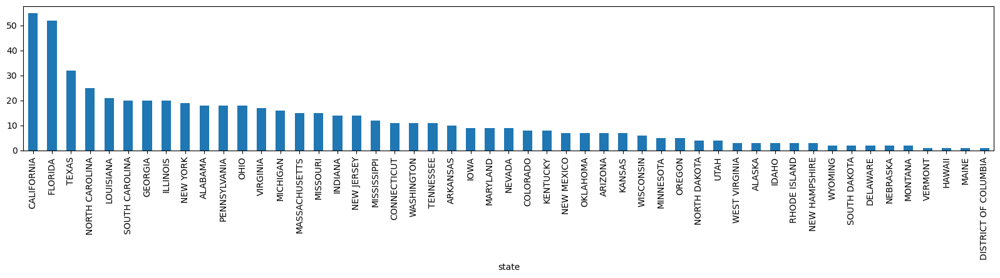

In [257]:
incidents_by_city_df.groupby('state')[0].count().sort_values(ascending=False).plot(kind='bar', figsize=(20, 3));

Visualize average of all time series:

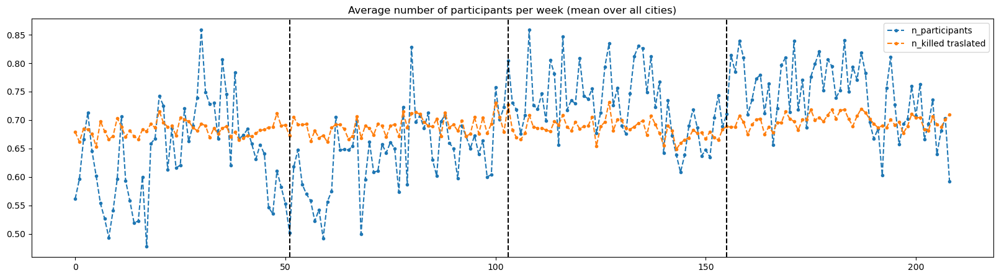

In [258]:
n_weeks_per_year = 52

plt.figure(figsize=(20, 5))
plt.plot(np.nanmean(incidents_by_city_df.values, axis=0), '.--', label='n_participants')
#plt.plot(np.nanmean(incidents_killed_by_city_df.values, axis=0), '.--', label='n_killed')
plt.plot(np.nanmean((incidents_killed_by_city_df.values+incidents_by_city_df.values.mean()-incidents_killed_by_city_df.values.mean()
    ), axis=0), '.--', label='n_killed traslated') # traslate n_killed to have the same mean of n_participants
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend()
plt.title('Average number of participants per week (mean over all cities)');

Visualize time series for New York, Los Angeles, Chicago:

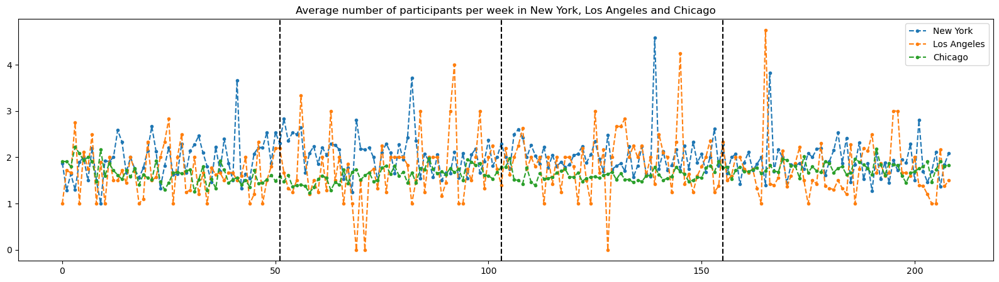

In [259]:
plt.figure(figsize=(20, 5))
new_york_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'City of New York')].values[0]
los_angeles_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Los Angeles')].values[0]
chicago_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Chicago')].values[0]
plt.plot(new_york_ts, '.--', label='New York')
plt.plot(los_angeles_ts, '.--', label='Los Angeles')
plt.plot(chicago_ts, '.--', label='Chicago')
plt.title('Average number of participants per week in New York, Los Angeles and Chicago')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend();

Visualize time series for city in ALASKA state:

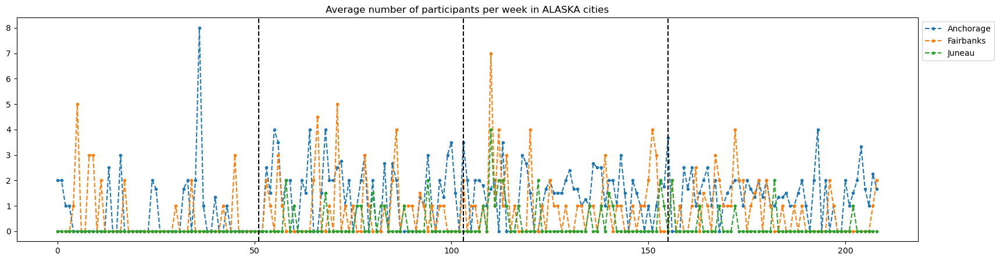

In [260]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.T, '.--')
plt.title('Average number of participants per week in ALASKA cities')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'
    ].index.get_level_values('city'), loc='upper left', bbox_to_anchor=(1, 1));

We visualize the number of zero values in the time series of each city:

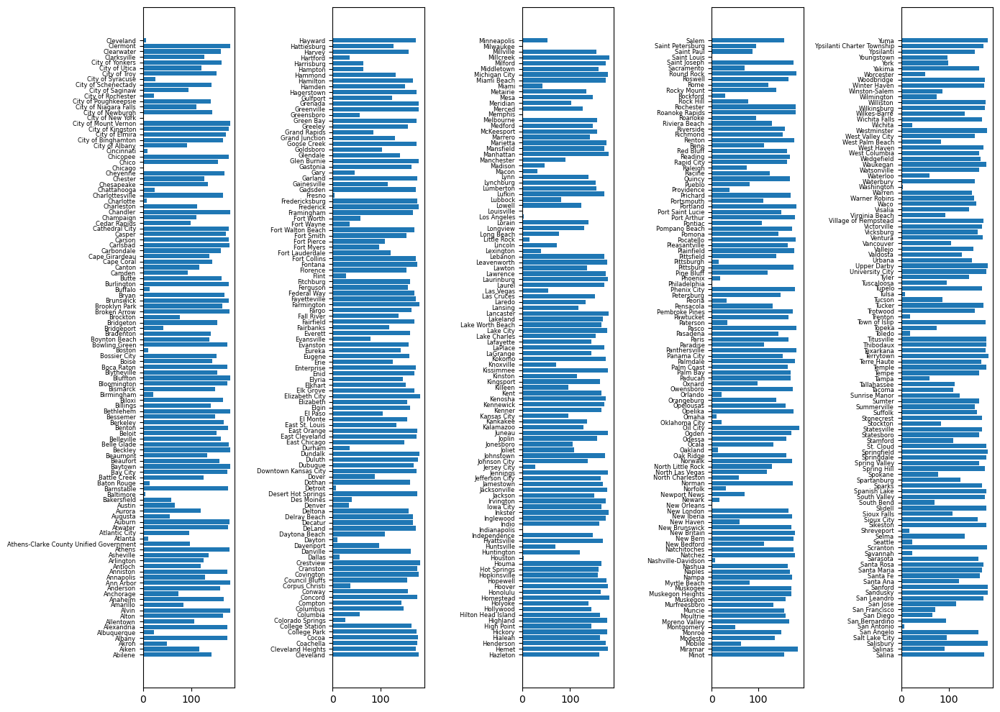

In [261]:
# visualize how many zeros in time series for each city
plt.figure(figsize=(14, 10))
plt.subplot(1, 5, 1)
plt.barh(incidents_by_city_df[:118].index.get_level_values('city'),
    incidents_by_city_df[:118].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 2)
plt.barh(incidents_by_city_df[118:236].index.get_level_values('city'),
    incidents_by_city_df[118:236].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 3)
plt.barh(incidents_by_city_df[236:354].index.get_level_values('city'),
    incidents_by_city_df[236:354].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 4)
plt.barh(incidents_by_city_df[354:471].index.get_level_values('city'),
    incidents_by_city_df[354:471].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 5)
plt.barh(incidents_by_city_df[471:].index.get_level_values('city'),
    incidents_by_city_df[471:].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
#plt.suptitle('Number of zeros in time series for each city')
plt.tight_layout();

## Preprocessing

### Translate and Scaling Time Series

In [262]:
new_york_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'City of New York')].values[0]
los_angeles_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'Los Angeles')].values[0]
chicago_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'Chicago')].values[0]

Offset translation:

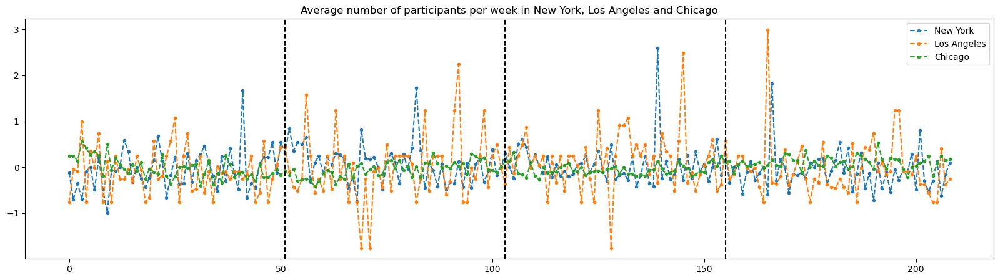

In [263]:
plt.figure(figsize=(20, 5))
plt.plot(new_york_ts-np.nanmean(new_york_ts), '.--', label='New York')
plt.plot(los_angeles_ts-np.nanmean(los_angeles_ts), '.--', label='Los Angeles')
plt.plot(chicago_ts-np.nanmean(chicago_ts), '.--', label='Chicago')
plt.title('Average number of participants per week in New York, Los Angeles and Chicago')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend();

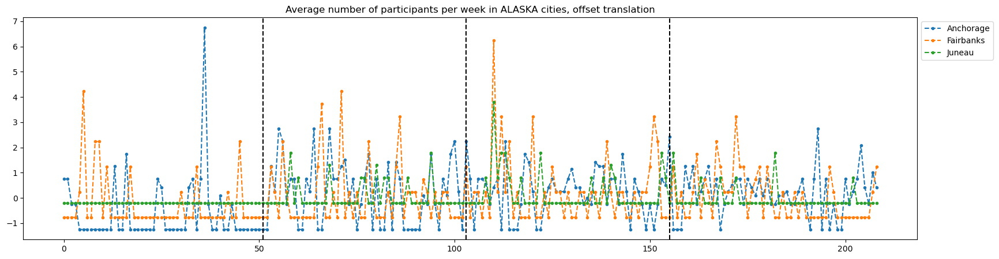

In [264]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.T - 
    incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.mean(axis=1), '.--')
plt.title('Average number of participants per week in ALASKA cities, offset translation')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].index.get_level_values('city'), 
    loc='upper left', bbox_to_anchor=(1, 1));

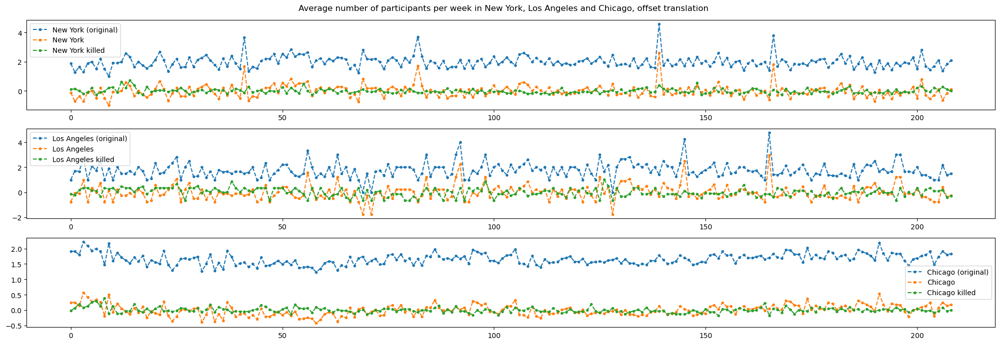

In [265]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(new_york_ts-np.nanmean(new_york_ts), '.--', label='New York')
ax[0].plot(new_york_killed_ts-np.nanmean(new_york_killed_ts), '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles (original)')
ax[1].plot(los_angeles_ts-np.nanmean(los_angeles_ts), '.--', label='Los Angeles')
ax[1].plot(los_angeles_killed_ts-np.nanmean(los_angeles_killed_ts), '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago (original)')
ax[2].plot(chicago_ts-np.nanmean(chicago_ts), '.--', label='Chicago')
ax[2].plot(chicago_killed_ts-np.nanmean(chicago_killed_ts), '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago, offset translation')
plt.tight_layout();

Amplitude scale:

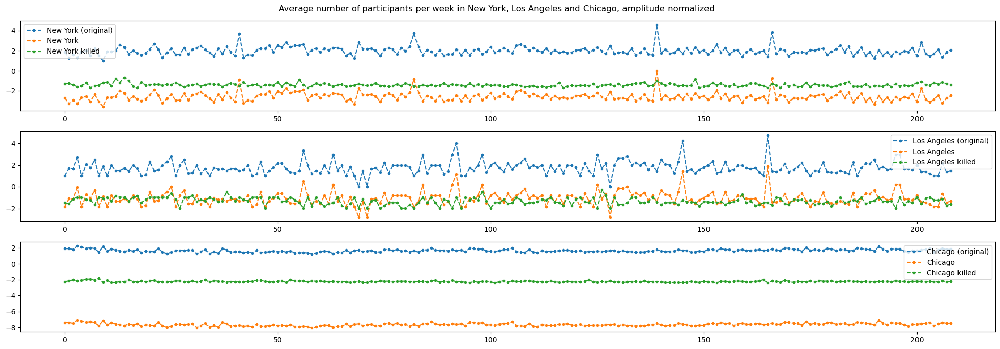

In [266]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(new_york_ts-np.nanmean(new_york_ts)/np.std(new_york_ts), '.--', label='New York')
ax[0].plot(new_york_killed_ts-np.nanmean(new_york_killed_ts)/np.std(new_york_killed_ts), '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles (original)')
ax[1].plot(los_angeles_ts-np.nanmean(los_angeles_ts)/np.std(los_angeles_ts), '.--', label='Los Angeles')
ax[1].plot(los_angeles_killed_ts-np.nanmean(los_angeles_killed_ts)/np.std(los_angeles_killed_ts), '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago (original)')
ax[2].plot(chicago_ts-np.nanmean(chicago_ts)/np.std(chicago_ts), '.--', label='Chicago')
ax[2].plot(chicago_killed_ts-np.nanmean(chicago_killed_ts)/np.std(chicago_killed_ts), '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago, amplitude normalized')
fig.tight_layout();


### Noise detection: tslearn library

tslearn is a Python package that provides machine learning tools for the analysis of time series. This package builds on (and hence depends on) scikit-learn, numpy and scipy libraries.

We used the TimeSeriesScalerMeanVariance from tslear.
This scaler standardizes time series data so that the mean in each dimension is set to *mu* and the standard deviation is set to *std*. In your case, you've mentioned that you used the default parameters with *mu=0* and *std=1*.

In [267]:
scaler = TimeSeriesScalerMeanVariance()
X = scaler.fit_transform(incidents_by_city_df.values)

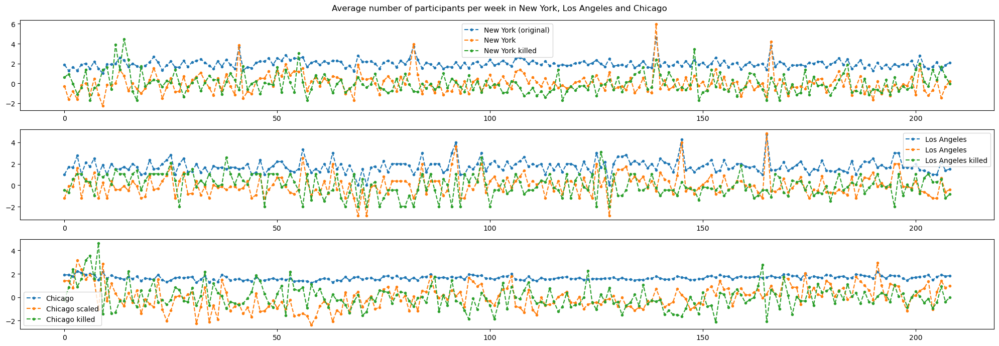

In [268]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(scaler.fit_transform(new_york_ts.reshape(1, -1))[0], '.--', label='New York')
ax[0].plot(scaler.fit_transform(new_york_killed_ts.reshape(1, -1))[0], '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles')
ax[1].plot(scaler.fit_transform(los_angeles_ts.reshape(1, -1))[0], '.--', label='Los Angeles')
ax[1].plot(scaler.fit_transform(los_angeles_killed_ts.reshape(1, -1))[0], '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago')
ax[2].plot(scaler.fit_transform(chicago_ts.reshape(1, -1))[0], '.--', label='Chicago scaled')
ax[2].plot(scaler.fit_transform(chicago_killed_ts.reshape(1, -1))[0], '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago')
fig.tight_layout();

### Compute Distance Between Time Series

In [269]:
def ts_distance(ts1, ts2, city, verbose=True):
    if verbose: print(f'Time Series distance for {city}')
    ts_distance_df = pd.DataFrame()
    ts_distance_df.loc['euclidean', 'Original Time Series'] = euclidean(ts1, ts2)
    _, ts_distance_df.loc['DTW', 'Original Time Series'] = dtw(ts1, ts2)
    ts_distance_df.loc['euclidean', 'Offset Translation'] = euclidean(ts1-np.nanmean(ts1), ts2-np.nanmean(ts2))
    _, ts_distance_df.loc['DTW', 'Offset Translation'] = dtw(ts1-np.nanmean(ts1), ts2-np.nanmean(ts2))
    ts_distance_df.loc['euclidean', 'Amplitude Scaling'] = euclidean(ts1-np.nanmean(ts1)/np.std(ts1), ts2-np.nanmean(ts2)/np.std(ts2))
    _, ts_distance_df.loc['DTW', 'Amplitude Scaling'] = dtw(ts1-np.nanmean(ts1)/np.std(ts1), ts2-np.nanmean(ts2)/np.std(ts2))
    scaler = TimeSeriesScalerMeanVariance()
    ts_distance_df.loc['euclidean', 'Mean Variance Scaling'] = euclidean(scaler.fit_transform(ts1.reshape(1, -1))[0].reshape(-1), 
        scaler.fit_transform(ts2.reshape(1, -1))[0].reshape(-1))
    _, ts_distance_df.loc['DTW', 'Mean Variance Scaling'] = dtw(scaler.fit_transform(ts1.reshape(1, -1))[0].reshape(-1), 
        scaler.fit_transform(ts2.reshape(1, -1))[0].reshape(-1))
    if verbose: display(ts_distance_df)
    return ts_distance_df

We compute the distance between time series generated using the n_participants values and those generated using n_killed for all the transformations implemented before.

For visualization purpuse, we calculated and display the distances for the time series related to the cities of New York, Los Angeles, and Chicago, as well as the time series representing the average of all cities.

As metrics to compute distance we use Dynamic Time Warping (DTW) and Euclidan distance.

In [270]:
ts_distance(new_york_ts, new_york_killed_ts, 'City of New York')
ts_distance(los_angeles_ts, los_angeles_killed_ts, 'Los Angeles')
ts_distance(chicago_ts, chicago_killed_ts, 'Chicago')
ts_distance(incidents_by_city_df.mean(axis=0).values, incidents_killed_by_city_df.mean(axis=0).values, 'Average All Cities')

Time Series distance for City of New York


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,25.641264,6.470026,18.125146,19.313367
DTW,21.711393,4.828293,15.552054,10.625221


Time Series distance for Los Angeles


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,18.916004,10.037778,10.707546,20.087158
DTW,11.147646,6.416849,6.965931,10.994166


Time Series distance for Chicago


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,21.229690,2.697980,78.321722,19.028593
DTW,21.216154,1.687273,78.321722,9.973122


Time Series distance for Average All Cities


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,8.535847,1.110076,12.8925,14.488508
DTW,8.535847,0.910616,12.8925,9.457654


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,8.535847,1.110076,12.8925,14.488508
DTW,8.535847,0.910616,12.8925,9.457654


Cumpute distance between time series generated using the n_participants values and those generated using n_killed for all the transformations implemented before for all the time series and visualize them:

In [271]:
original_ts_distance = []
offset_translation_ts_distance = []
amplitude_scaling_ts_distance = []
mean_variance_scaling_ts_distance = []

for ts1, ts2 in zip(incidents_by_city_df.values, incidents_killed_by_city_df.values):
    ts_distance_df = ts_distance(ts1, ts2, '', verbose=False)
    original_ts_distance.append(ts_distance_df.loc['DTW', 'Original Time Series'])
    offset_translation_ts_distance.append(ts_distance_df.loc['DTW', 'Offset Translation'])
    amplitude_scaling_ts_distance.append(ts_distance_df.loc['DTW', 'Amplitude Scaling'])
    mean_variance_scaling_ts_distance.append(ts_distance_df.loc['DTW', 'Mean Variance Scaling'])

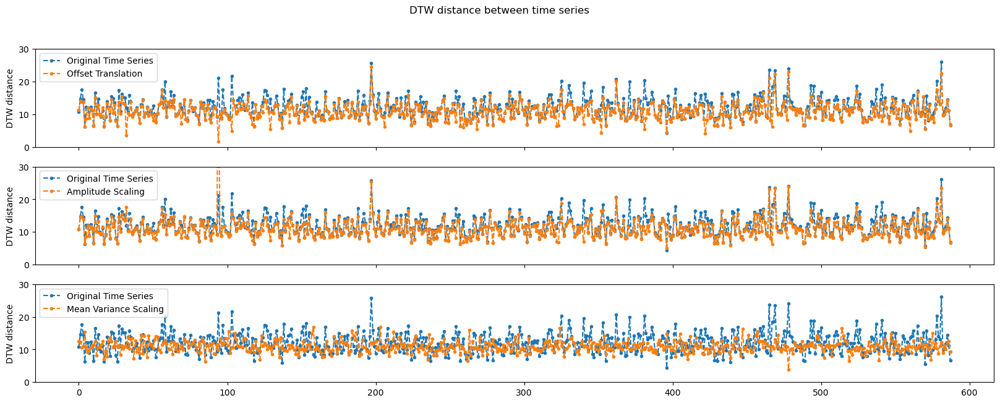

In [272]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7), sharex=True, sharey=True)
ax[0].plot(original_ts_distance, '.--', label='Original Time Series')
ax[0].plot(offset_translation_ts_distance, '.--', label='Offset Translation')
ax[0].legend()
ax[0].set_ylabel('DTW distance')
ax[0].set_ylim(0, 30)

ax[1].plot(original_ts_distance, '.--', label='Original Time Series')
ax[1].plot(amplitude_scaling_ts_distance, '.--', label='Amplitude Scaling')
ax[1].legend()
ax[1].set_ylabel('DTW distance')

ax[2].plot(original_ts_distance, '.--', label='Original Time Series')
ax[2].plot(mean_variance_scaling_ts_distance, '.--', label='Mean Variance Scaling')
ax[2].legend()
ax[2].set_ylabel('DTW distance')

fig.suptitle('DTW distance between time series');

Each point on the plot represents the distance between the time series for a specific city.

We note that the time series scaled using the tslearn library are those for which the distance is minimized between the time series generated using n_participants and those generated using n_killed.

## Create dataset for Cities

To better understand the cluster analysis on the time series we are going to perform afterward, we have created a dataset containing data for each city by extracting information from the available dataset.

| Feature                      | Description                                             |
|------------------------------|---------------------------------------------------------|
| population_state_2010         | Mean population of the state in the year 2010.           |
| population_quantile           | Quantile of population_state_2010 (categorical).        |
| n_incidents_2014              | Number of incidents in the year 2014.                    |
| n_incidents_2015              | Number of incidents in the year 2015.                    |
| n_incidents_2016              | Number of incidents in the year 2016.                    |
| n_incidents_2017              | Number of incidents in the year 2017.                    |
| n_incidents                   | Total number of incidents across all years.              |
| n_incidents_quantile          | Quantile of n_incidents (categorical).                   |
| n_weeks_with_incidents_2014   | Number of weeks with incidents in the year 2014.         |
| n_weeks_with_incidents_2015   | Number of weeks with incidents in the year 2015.         |
| n_weeks_with_incidents_2016   | Number of weeks with incidents in the year 2016.         |
| n_weeks_with_incidents_2017   | Number of weeks with incidents in the year 2017.         |
| n_weeks_with_incidents        | Total number of weeks with incidents across all years.   |
| n_weeks_quantile              | Quantile of n_weeks_with_incidents (categorical).        |
| n_participants_2014          | Total number of participants in incidents in 2014.       |
| n_participants_2015          | Total number of participants in incidents in 2015.       |
| n_participants_2016          | Total number of participants in incidents in 2016.       |
| n_participants_2017          | Total number of participants in incidents in 2017.       |
| n_participants               | Total number of participants across all years.           |
| n_participants_avg_2014      | Average number of participants in incidents in 2014.     |
| n_participants_avg_2015      | Average number of participants in incidents in 2015.     |
| n_participants_avg_2016      | Average number of participants in incidents in 2016.     |
| n_participants_avg_2017      | Average number of participants in incidents in 2017.     |
| n_participants_avg           | Average number of participants across all years.         |
| n_killed_2014                | Total number of killed in incidents in 2014.             |
| n_killed_2015                | Total number of killed in incidents in 2015.             |
| n_killed_2016                | Total number of killed in incidents in 2016.             |
| n_killed_2017                | Total number of killed in incidents in 2017.             |
| n_killed                     | Total number of killed across all years.                 |
| n_killed_avg_2014            | Average number of killed in incidents in 2014.           |
| n_killed_avg_2015            | Average number of killed in incidents in 2015.           |
| n_killed_avg_2016            | Average number of killed in incidents in 2016.           |
| n_killed_avg_2017            | Average number of killed in incidents in 2017.           |
| n_killed_avg                 | Average number of killed across all years.               |


In [273]:
# create a dataframe with as index city and state
cities_df = incidents_df.groupby(['city', 'state'])['population_state_2010'].mean() # population_state_2010
cities_df = pd.DataFrame(cities_df)

# quantile of population_state_2010
cities_df['population_quantile'] = pd.qcut(cities_df['population_state_2010'], 4, labels=False)

# n_incidents
cities_df['n_incidents_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['week'].count()
cities_df['n_incidents_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['week'].count()
cities_df['n_incidents_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['week'].count()
cities_df['n_incidents_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['week'].count()
cities_df['n_incidents'] = incidents_df.groupby(['city', 'state'])['week'].count()
cities_df['n_incidents_quantile'] = pd.qcut(cities_df['n_incidents'], 4, labels=False)

# n_weeks_with_incidents
cities_df['n_weeks_with_incidents_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['week'].nunique()
cities_df['n_weeks_with_incidents_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['week'].nunique()
cities_df['n_weeks_with_incidents_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['week'].nunique()
cities_df['n_weeks_with_incidents_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['week'].nunique()
cities_df['n_weeks_with_incidents'] = incidents_df.groupby(['city', 'state'])['week'].nunique()
cities_df['n_weeks_quantile'] = pd.qcut(cities_df['n_weeks_with_incidents'], 4, labels=False)

# n_participants
cities_df['n_participants_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['n_participants'].sum()
cities_df['n_participants_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['n_participants'].sum()
cities_df['n_participants_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['n_participants'].sum()
cities_df['n_participants_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['n_participants'].sum()
cities_df['n_participants'] = incidents_df.groupby(['city', 'state'])['n_participants'].sum()

# n_participants_avg
cities_df['n_participants_avg_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['n_participants'].mean()
cities_df['n_participants_avg_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['n_participants'].mean()
cities_df['n_participants_avg_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['n_participants'].mean()
cities_df['n_participants_avg_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['n_participants'].mean()
cities_df['n_participants_avg'] = incidents_df.groupby(['city', 'state'])['n_participants'].mean()

# n_killed
cities_df['n_killed_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['n_killed'].sum()
cities_df['n_killed_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['n_killed'].sum()
cities_df['n_killed_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['n_killed'].sum()
cities_df['n_killed_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['n_killed'].sum()
cities_df['n_killed'] = incidents_df.groupby(['city', 'state'])['n_killed'].sum()

# n_killed_avg
cities_df['n_killed_avg_2014'] = incidents_df[incidents_df['year']==2014].groupby(['city', 'state'])['n_killed'].mean()
cities_df['n_killed_avg_2015'] = incidents_df[incidents_df['year']==2015].groupby(['city', 'state'])['n_killed'].mean()
cities_df['n_killed_avg_2016'] = incidents_df[incidents_df['year']==2016].groupby(['city', 'state'])['n_killed'].mean()
cities_df['n_killed_avg_2017'] = incidents_df[incidents_df['year']==2017].groupby(['city', 'state'])['n_killed'].mean()
cities_df['n_killed_avg'] = incidents_df.groupby(['city', 'state'])['n_killed'].mean()

In [274]:
cities_df.head(2)

,,population_state_2010,population_quantile,n_incidents_2014,n_incidents_2015,n_incidents_2016,n_incidents_2017,n_incidents,n_incidents_quantile,n_weeks_with_incidents_2014,n_weeks_with_incidents_2015,...,n_killed_2014,n_killed_2015,n_killed_2016,n_killed_2017,n_killed,n_killed_avg_2014,n_killed_avg_2015,n_killed_avg_2016,n_killed_avg_2017,n_killed_avg
city,state,,,,,,,,,,,,,,,,,,,,,
Abilene,TEXAS,25145561.0,3,11.0,9.0,47,37,104,2,10.0,8.0,...,4.0,4.0,4.0,7.0,19.0,0.363636,0.444444,0.085106,0.189189,0.182692
Aiken,SOUTH CAROLINA,4625364.0,0,21.0,52.0,34,29,136,2,14.0,33.0,...,2.0,5.0,5.0,4.0,16.0,0.095238,0.096154,0.147059,0.137931,0.117647


We display a description of the features in the dataset:

In [275]:
cities_df[['population_state_2010', 'population_quantile', 'n_incidents_2014', 'n_incidents_2015', 'n_incidents_2016',
    'n_incidents_2017', 'n_incidents']].describe()

,population_state_2010,population_quantile,n_incidents_2014,n_incidents_2015,n_incidents_2016,n_incidents_2017,n_incidents
count,5.880000e+02,588.000000,585.000000,585.000000,588.000000,588.000000,588.000000
mean,1.182544e+07,1.394558,38.241026,44.307692,57.542517,60.744898,200.414966
std,1.031046e+07,1.075088,100.496618,119.879410,162.734302,152.062659,525.431895
min,5.636260e+05,0.000000,1.000000,1.000000,3.000000,3.000000,31.000000
25%,4.625364e+06,0.000000,7.000000,9.000000,12.000000,13.000000,42.000000
50%,8.001024e+06,1.000000,13.000000,15.000000,20.000000,21.000000,68.000000
75%,1.880131e+07,2.000000,32.000000,37.000000,48.000000,50.250000,163.250000
max,3.725396e+07,3.000000,1776.000000,2262.000000,3293.000000,2886.000000,10217.000000


In [276]:
cities_df[['n_weeks_with_incidents_2014', 'n_weeks_with_incidents_2015', 
    'n_weeks_with_incidents_2016', 'n_weeks_with_incidents_2017', 'n_weeks_with_incidents']].describe()

,n_weeks_with_incidents_2014,n_weeks_with_incidents_2015,n_weeks_with_incidents_2016,n_weeks_with_incidents_2017,n_weeks_with_incidents
count,585.000000,585.000000,588.000000,588.000000,588.000000
mean,16.343590,18.430769,21.724490,22.671769,78.629252
std,13.705185,14.300556,14.508845,14.247726,53.963348
min,1.000000,1.000000,2.000000,2.000000,22.000000
25%,6.000000,8.000000,10.000000,11.750000,36.000000
50%,11.000000,13.000000,16.000000,17.000000,54.000000
75%,23.000000,26.000000,31.000000,32.000000,110.000000
max,53.000000,53.000000,53.000000,53.000000,209.000000


In [277]:
cities_df[['n_participants_2014', 'n_participants_2015', 'n_participants_2016', 'n_participants_2017',
    'n_participants', 'n_participants_avg_2014', 'n_participants_avg_2015', 'n_participants_avg_2016',
    'n_participants_avg_2017', 'n_participants_avg']].describe()

,n_participants_2014,n_participants_2015,n_participants_2016,n_participants_2017,n_participants,n_participants_avg_2014,n_participants_avg_2015,n_participants_avg_2016,n_participants_avg_2017,n_participants_avg
count,585.000000,585.000000,588.000000,588.000000,588.000000,585.000000,585.000000,588.000000,588.000000,588.000000
mean,75.892308,80.565812,101.076531,103.836735,360.573129,2.086534,1.827086,1.773158,1.710052,1.822003
std,174.921725,207.985666,272.816678,263.982565,900.944978,0.508544,0.356812,0.324225,0.281978,0.206403
min,1.000000,1.000000,4.000000,4.000000,42.000000,1.000000,1.000000,1.000000,1.000000,1.045455
25%,15.000000,16.000000,20.750000,22.000000,78.000000,1.769231,1.600000,1.565217,1.537775,1.688277
50%,28.000000,27.000000,37.000000,38.000000,127.000000,2.000000,1.800000,1.737986,1.691134,1.803452
75%,64.000000,69.000000,84.000000,83.000000,297.000000,2.333333,2.000000,1.961080,1.873005,1.956028
max,2835.000000,3698.000000,5289.000000,5095.000000,16917.000000,7.000000,3.454545,3.333333,3.000000,2.439024


In [278]:
cities_df[['n_killed_2014', 'n_killed_2015', 'n_killed_2016', 'n_killed_2017', 'n_killed',
    'n_killed_avg_2014', 'n_killed_avg_2015', 'n_killed_avg_2016', 'n_killed_avg_2017', 'n_killed_avg']].describe()

,n_killed_2014,n_killed_2015,n_killed_2016,n_killed_2017,n_killed,n_killed_avg_2014,n_killed_avg_2015,n_killed_avg_2016,n_killed_avg_2017,n_killed_avg
count,585.000000,585.000000,588.000000,588.000000,588.000000,585.000000,585.000000,588.000000,588.000000,588.000000
mean,11.372650,12.605128,13.838435,15.908163,53.602041,0.325495,0.315006,0.251874,0.255667,0.268558
std,27.602944,30.480900,35.872138,38.929391,130.666975,0.244719,0.226700,0.191009,0.182338,0.156014
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.014706
25%,2.000000,2.000000,2.000000,2.000000,10.000000,0.142857,0.133333,0.111111,0.125000,0.148193
50%,4.000000,4.000000,5.000000,6.000000,18.000000,0.285714,0.285714,0.212618,0.222222,0.243573
75%,9.000000,10.000000,10.000000,13.000000,39.000000,0.473684,0.457143,0.339047,0.358612,0.352941
max,393.000000,422.000000,559.000000,606.000000,1980.000000,1.500000,1.250000,1.000000,1.100000,0.931818


We compute and visualize the correlation between the features n_incidents, n_participants, n_killed and population_state_2010:

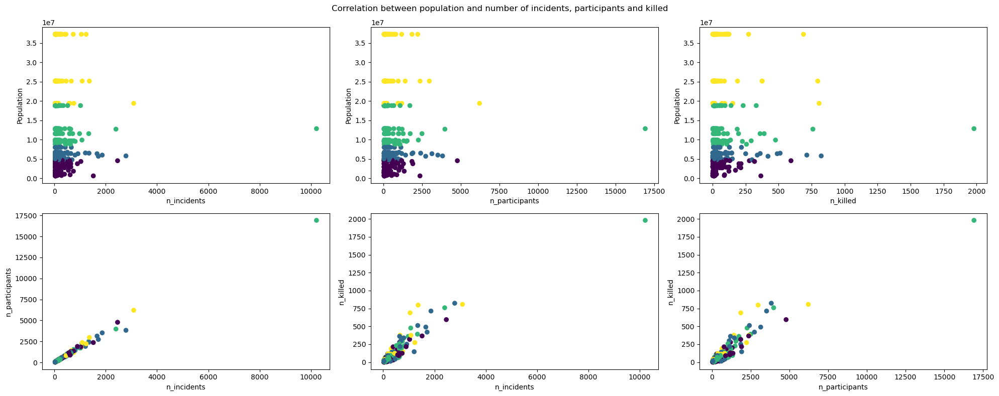

In [279]:
# make a plot to compare n_incidents, n_participants, n_killed an population
fig, ax = plt.subplots(2, 3, figsize=(20, 8))
ax[0, 0].scatter(cities_df['n_incidents'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 0].set_xlabel('n_incidents')
ax[0, 0].set_ylabel('Population')
ax[0, 1].scatter(cities_df['n_participants'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 1].set_xlabel('n_participants')
ax[0, 1].set_ylabel('Population')
ax[0, 2].scatter(cities_df['n_killed'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 2].set_xlabel('n_killed')
ax[0, 2].set_ylabel('Population')
ax[1, 0].scatter(cities_df['n_incidents'].values, cities_df['n_participants'].values,
    c=cities_df['population_quantile'].values)
ax[1, 0].set_xlabel('n_incidents')
ax[1, 0].set_ylabel('n_participants')
ax[1, 1].scatter(cities_df['n_incidents'].values, cities_df['n_killed'].values,
    c=cities_df['population_quantile'].values)
ax[1, 1].set_xlabel('n_incidents')
ax[1, 1].set_ylabel('n_killed')
ax[1, 2].scatter(cities_df['n_participants'].values, cities_df['n_killed'].values,
    c=cities_df['population_quantile'].values)
ax[1, 2].set_xlabel('n_participants')
ax[1, 2].set_ylabel('n_killed')
fig.suptitle('Correlation between population and number of incidents, participants and killed')
fig.tight_layout();

Note that in the scatterplot:
- Purple represents the first quantile of the population of the state.
- Blue represents the second quantile.
- Green represents the third quantile.
- Yellow represents the fourth quantile.

We compute correlation values using Kendall correlation coefficient:

In [280]:
# correlation coefficient
cities_df[['n_incidents', 'n_participants', 'n_killed', 'population_state_2010']].corr('kendall')

,n_incidents,n_participants,n_killed,population_state_2010
n_incidents,1.000000,0.901945,0.579616,0.015550
n_participants,0.901945,1.000000,0.611372,0.011675
n_killed,0.579616,0.611372,1.000000,0.068313
population_state_2010,0.015550,0.011675,0.068313,1.000000


## Clustering

We conduct clustering analysis on time series data utilizing various techniques. 

Our objective is to group cities with similar temporal patterns by leveraging the created time series and a predefined scoring mechanism. 

Following the clustering process, we analyze the results and extract motifs and anomalies from the time series data, aiming for a comprehensive understanding and exploration of the udata.

In [355]:
def plot_timeseries_per_cluster(labels):
    n_clusters = len(np.unique(labels))
    fig, ax = plt.subplots(math.ceil(n_clusters/2), 2, figsize=(20, 20))
    print(np.shape(ax))
    colors = plt.rcParams["axes.prop_cycle"]()

    max_num_samples_per_cluster = 5
    for c in range(n_clusters):
        ax_c = ax[c//2, c%2]
        ax_c.set_title(f'Cluster {c}', fontsize=8)
        ax_c.set_axisbelow(True)
        for i, idx in enumerate(np.where(labels == c)[0]):
            if i >= max_num_samples_per_cluster:
                break
            ax_c.plot(X[idx], '.--', color=next(colors)['color'])
    fig.tight_layout();

### Shape-based clustering: k-means

We utilize the k-means clustering algorithm on time series data, employing the TimeSeriesScalerMeanVariance object from the tslearn library for scaling. 

The clustering process is executed through the TimeSeriesKMeans method from the tslearn library, where we utilize the Dynamic Time Warping (DTW) distance as the metric. 
We set the maximum number of iterations to 100 to optimize the clustering results.

$DTW(X, Y) = \min_{\pi} \sqrt{\sum_{(i, j) \in \pi} d(x_i, y_j)^2}$

This equation defines the DTW distance between two time series, \(X\) and \(Y\), where \(\pi\) represents the alignment path, and \(d(x_i, y_j)\) is the local distance between corresponding elements \(x_i\) and \(y_j\). The DTW distance is the minimum cumulative distance along the optimal alignment path.

Choose best k:

In [281]:
X = TimeSeriesScalerMeanVariance().fit_transform(incidents_by_city_df.values) # scale time series

In [ ]:
inertia_list = [] # sum of distances of samples to their closest cluster center

for k in range(2, 20):
    km = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=100, random_state=42)
    km.fit(X)
    pred = km.predict(X)
    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", km.inertia_)
    inertia_list.append(km.inertia_)

n clusters =  2 	 Clusters = [349 239] 	 Inertia = 60.4063850393696
n clusters =  3 	 Clusters = [ 89 195 304] 	 Inertia = 58.32366768484471
n clusters =  4 	 Clusters = [112  78 270 128] 	 Inertia = 57.31812663606435
n clusters =  5 	 Clusters = [ 87  54 283 118  46] 	 Inertia = 56.94034054100224
n clusters =  6 	 Clusters = [ 81  45 251  70  38 103] 	 Inertia = 55.83880163905003
n clusters =  7 	 Clusters = [ 81  39 238  52  32  89  57] 	 Inertia = 55.28792762918835
n clusters =  8 	 Clusters = [ 61  43 141  54  62  94  84  49] 	 Inertia = 53.802933235082754
n clusters =  9 	 Clusters = [ 59  29 120  43  56 116  79  42  44] 	 Inertia = 53.482981607961015
n clusters =  10 	 Clusters = [ 65  27 110  35  59 105  79  25  45  38] 	 Inertia = 52.837655407936055
n clusters =  11 	 Clusters = [53 19 92 39 41 85 99 30 41 36 53] 	 Inertia = 52.76667383031773
n clusters =  12 	 Clusters = [54 28 84 32 37 82 68 24 42 36 48 53] 	 Inertia = 52.18155692903985
n clusters =  13 	 Clusters = [50 20 57

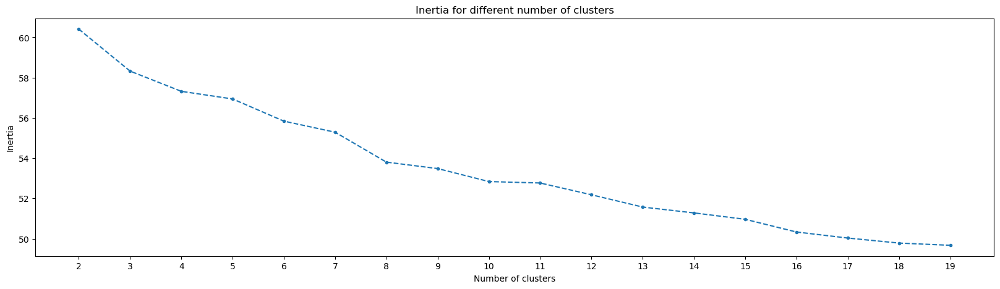

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(inertia_list, '.--')
plt.xticks(range(len(inertia_list)), range(2, 20))
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia for different number of clusters');

Fit chosen model (k=10):

In [282]:
best_k = 10
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=100, random_state=42)
km.fit(X)

TimeSeriesKMeans(max_iter=100, metric='dtw', n_clusters=10, random_state=42)

We visualize cluster's centroids:

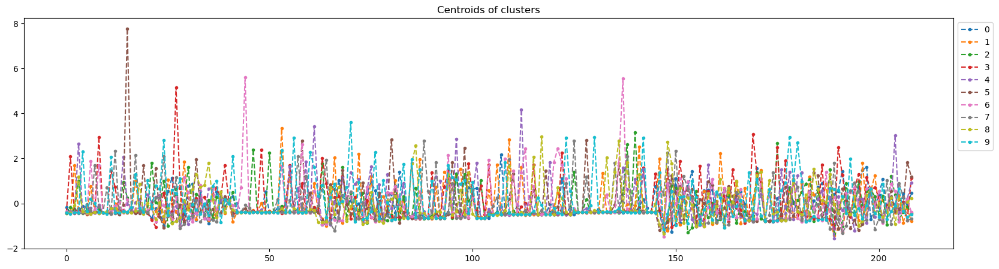

In [283]:
plt.figure(figsize=(20, 5))
plt.plot(km.cluster_centers_.reshape(incidents_by_city_df.values.shape[1], best_k), '.--')
plt.title('Centroids of clusters')
plt.legend(range(11), loc='upper left', bbox_to_anchor=(1, 1));

In [284]:
km.inertia_ # Sum of distances of samples to their closest cluster center

52.837655407936055

In [285]:
cluster = km.fit_predict(incidents_by_city_df.values)

Visualize clusters

In [286]:
cluster_df = incidents_df.groupby(['city', 'state'])[['latitude', 'longitude']].mean().reset_index()
cluster_df['cluster_kmeans'] = cluster
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans
0,Abilene,TEXAS,32.453319,-99.745577,7
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3


We visualize clusters on a map:

In [287]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_kmeans'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

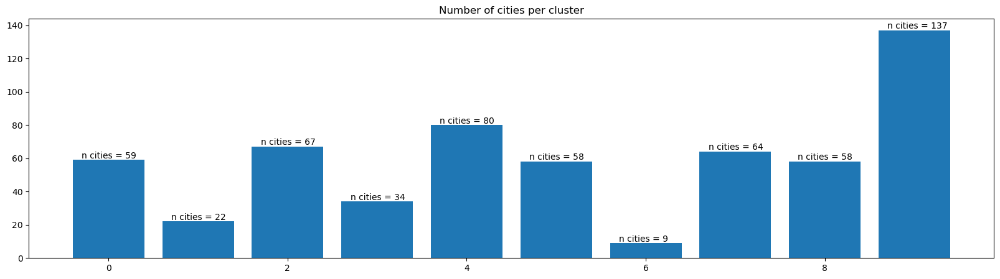

In [288]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_kmeans').size().index, cluster_df.groupby('cluster_kmeans').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_kmeans').size().values):
    plt.text(i-0.3, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

Visualize average of time series for each clusters:

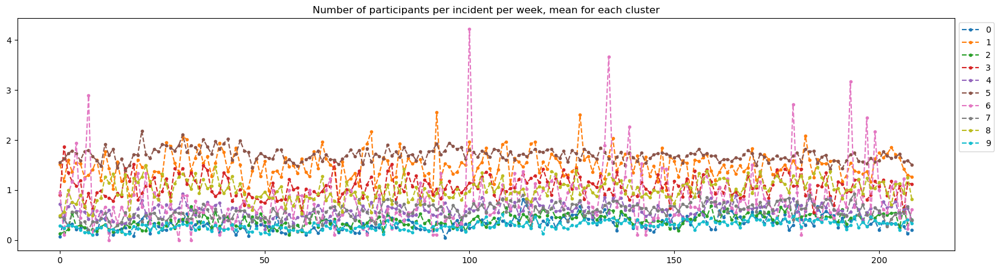

In [289]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df.groupby(cluster).mean().values.T, '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(cluster).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

Cluster 5: Higher values in time series indicate more incidents and involve a larger number of people.

Cluster 9: Lower values observed, likely representing cities with many zeros in the time series, i.e. fewer incidents.

Cluster 6: Time series in this cluster exhibit high variability with numerous fluctuations.

Cluster 1: Appears to contain time series with high values, although less pronounced than those in Cluster 5.

Visualize the time series belonging to Cluster 6 to better understand the high variability (y-axis is in logarithmic scale).

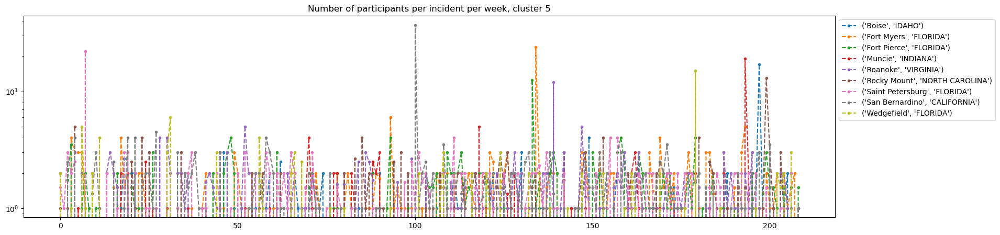

In [290]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[cluster==6].values.T, '.--')
plt.title('Number of participants per incident per week, cluster 5')
plt.yscale('log')
plt.legend(incidents_by_city_df[cluster==6].index, loc='upper left', bbox_to_anchor=(1, 1));

In [291]:
cities_cluster_6 = incidents_by_city_df[cluster==6].index.get_level_values('city').to_list()
cities_df[cities_df.index.get_level_values('city').isin(cities_cluster_6)][
    ['n_incidents', 'n_incidents_quantile', 'n_participants', 'n_participants_avg', 'n_killed', 'n_killed_avg',
    'population_state_2010', 'population_quantile']].sort_values('n_incidents', ascending=False)

,,n_incidents,n_incidents_quantile,n_participants,n_participants_avg,n_killed,n_killed_avg,population_state_2010,population_quantile
city,state,,,,,,,,
San Bernardino,CALIFORNIA,197,3,380.0,1.928934,121.0,0.614213,37253956.0,3
Roanoke,VIRGINIA,176,3,301.0,1.710227,36.0,0.204545,8001024.0,1
Fort Myers,FLORIDA,160,2,310.0,1.937500,48.0,0.300000,18801310.0,2
Saint Petersburg,FLORIDA,159,2,299.0,1.880503,72.0,0.452830,18801310.0,2
Fort Pierce,FLORIDA,134,2,245.0,1.828358,35.0,0.261194,18801310.0,2
Rocky Mount,NORTH CAROLINA,100,2,193.0,1.930000,29.0,0.290000,9535483.0,2
Boise,IDAHO,73,2,124.0,1.698630,20.0,0.273973,1567582.0,0
Muncie,INDIANA,66,1,126.0,1.909091,12.0,0.181818,6483802.0,1
Wedgefield,FLORIDA,48,1,114.0,2.375000,18.0,0.375000,18801310.0,2


In [292]:
print('Averege number of participants per incident in the whole dataset: ', incidents_df['n_participants'].mean())
print('Averege number of killed people per incident in the whole dataset: ', incidents_df['n_killed'].mean())

Averege number of participants per incident in the whole dataset:  1.7991327517735312
Averege number of killed people per incident in the whole dataset:  0.26745527986151185


We can observe that almost all the time series in Cluster 6 are associated with cities where the average number of participants and killed is higher than the overall dataset average.

Visualize how the population, the total number of incidents over the four years, and the number of weeks in which at least one accidents is happened in a city are distributed across clusters.

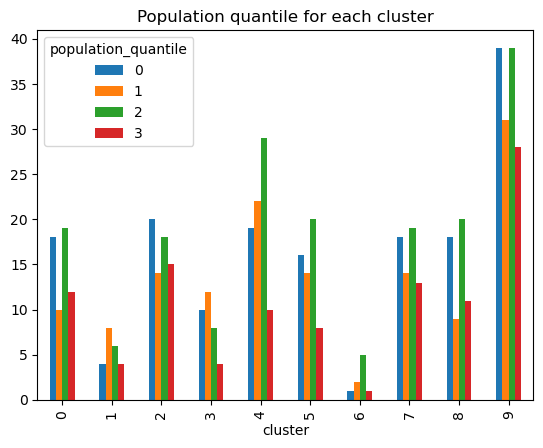

In [293]:
km_crosstab = pd.crosstab(km.labels_, cities_df['population_quantile'], rownames=['cluster'], colnames=['population_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Population quantile for each cluster');

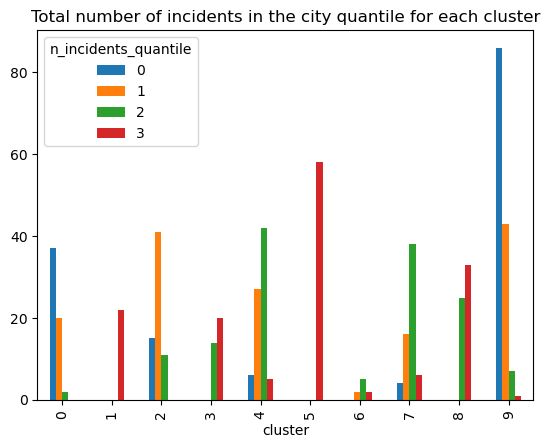

In [294]:
km_crosstab = pd.crosstab(km.labels_, cities_df['n_incidents_quantile'], rownames=['cluster'], colnames=['n_incidents_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Total number of incidents in the city quantile for each cluster');

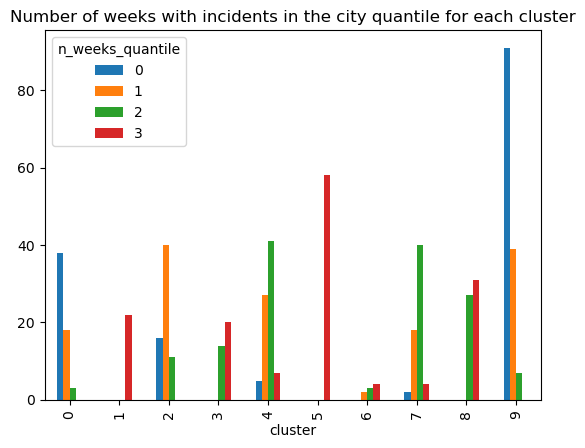

In [295]:
km_crosstab = pd.crosstab(km.labels_, cities_df['n_weeks_quantile'], rownames=['cluster'], colnames=['n_weeks_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Number of weeks with incidents in the city quantile for each cluster');

The population of the states to which the cities belong appears to be uniformly distributed across the clusters. 

Consistent with the earlier observation, in Cluster 5, only time series related to cities where the total number of participants in incidents and the number of weeks in which at least one incident occurred fall into the third quantile of the dataset with all the time series.

Within Cluster 9, the majority of cities are characterized by the number of participants in incidents and the number of weeks in which at least one incident occurred falling into the first quantile.

Performe the same cluster using time series with n_killed in order to compare the results.

In [296]:
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=100, random_state=42)
cluster_df['cluster_kmeans_killed'] = km.fit_predict(
    TimeSeriesScalerMeanVariance().fit_transform(incidents_killed_by_city_df.values))
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed
0,Abilene,TEXAS,32.453319,-99.745577,7,4
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4


In [297]:
sankey_plot(
    [cluster_df['cluster_kmeans'], cluster_df['cluster_kmeans_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison TimeSeriesKMeans'
)

From the Sankey plot, we can observe that there is no apparent correlation between the cluster analyses performed on the two distinct time series.

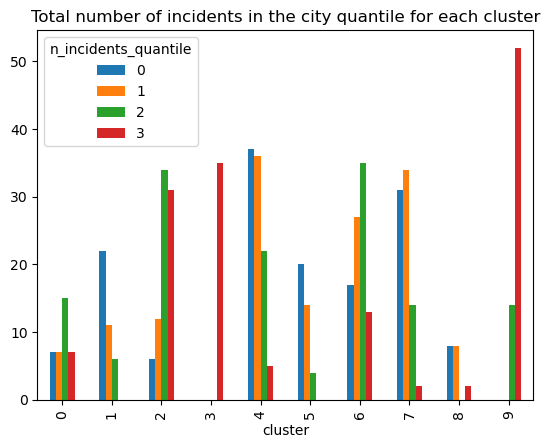

In [298]:
km_crosstab = pd.crosstab(km.labels_, cities_df['n_incidents_quantile'], rownames=['cluster'], colnames=['n_incidents_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Total number of incidents in the city quantile for each cluster');

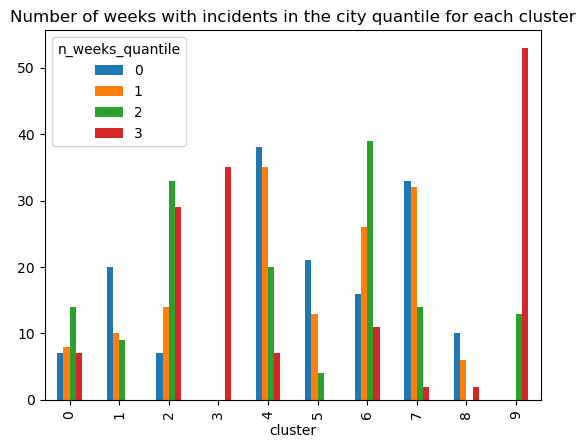

In [299]:
km_crosstab = pd.crosstab(km.labels_, cities_df['n_weeks_quantile'], rownames=['cluster'], colnames=['n_weeks_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Number of weeks with incidents in the city quantile for each cluster');

We can observe that clusters 3 and 9 in this analysis contain features belonging to the third quantile. In fact, they correspond to the cities belonging to cluster 5 in the previous analysis.

### Compression-based Clustering

We perform clustering on compressed versions of time series data. 
The compression is achieved using the following custom dissimilarity measure *cdm_dist*:
- The values of each time series are concatenated into strings and encoded in UTF-8.
- The strings are then compressed using zlib compression.
- The dissimilarity is calculated as the ratio of the compressed size of the concatenated strings to the sum of the compressed sizes of the individual strings.

After defining the dissimilarity measure, we apply it to calculate pairwise distances between the rows of the reshaped matrix X. The resulting matrix M contains the dissimilarity values and is used for clustering.

This approach allows us to run clustering on the compressed representations of time series data.

In [300]:
def cdm_dist(x, y):
    # compounding dissimilarity measure
    x_str = (' '.join([str(v) for v in x.ravel()])).encode('utf-8')
    y_str = (' '.join([str(v) for v in y.ravel()])).encode('utf-8')
    return len(zlib.compress(x_str + y_str)) / (len(zlib.compress(x_str)) + len(zlib.compress(y_str)))

X = incidents_by_city_df.values
M = pairwise_distances(X.reshape(X.shape[0], X.shape[1]), metric=cdm_dist)

#### Hierarchical Clustering on Compressed Time Series

We conduct hierarchical clustering on compressed time series data using the AgglomerativeClustering algorithm from scikit-learn.

Before performing hierarchical clustering, we conduct a preliminary analysis to determine the appropriate linkage method and the suitable number of clusters.

We evaluate different linkage methods to find the one that best captures the relationships in the data. Common linkage methods include:
- Single Linkage
- Complete Linkage
- Average Linkage
- Ward Linkage

To identify the optimal number of clusters, we explore different cluster sizes. The dendrogram inspection was employed to guide the selection of the most suitable number of clusters.

In [301]:
algorithms = ["single", "complete", "average", "ward"]
linkages = []
distance_thresholds = []
dm = pdist(M, metric='euclidean')
for algorithm in algorithms:
    linkage_res = linkage(dm, method=algorithm, metric='euclidean', optimal_ordering=False)
    linkages.append(linkage_res)
    distance_thresholds.append(0.7 * max(linkage_res[:,2]))

In [302]:
def plot_dendrograms(linkages, algorithms, thresholds):
    _, axs = plt.subplots(ncols=len(linkages), figsize=(32,7))

    for i in range(len(linkages)):
        axs[i].set_title(algorithms[i])
        axs[i].set_xlabel('IncidentID or (Cluster Size)')
        axs[i].set_ylabel('Distance')
        axs[i].axhline(thresholds[i], ls='--', color='k', label='threshold')
        color_threshold = thresholds[i]
        dendrogram(linkages[i], truncate_mode="lastp", p=30, leaf_rotation=60, leaf_font_size=8,
                show_contracted=True, ax=axs[i], color_threshold=color_threshold)

    plt.suptitle(('Hierarchical Clustering Dendograms'), fontsize=18, fontweight='bold')
    plt.show()

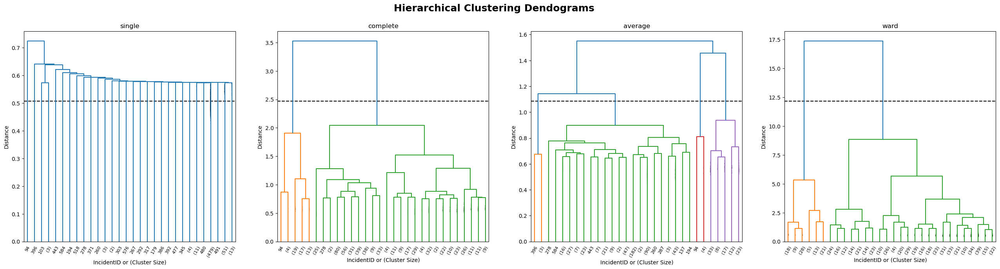

In [303]:
plot_dendrograms(linkages, algorithms, distance_thresholds)

We evaluate the clustering results using the cophenetic correlation coefficient:

In [304]:
cophenetic_coefs = []
for linkage in linkages:
    cophenetic_matrix = cophenet(linkage)
    cophenetic_coef = np.corrcoef(cophenetic_matrix, dm)[0][1]
    cophenetic_coefs.append(cophenetic_coef)
pd.DataFrame({'algorithm': algorithms, 'cophenetic_coef': cophenetic_coefs})

,algorithm,cophenetic_coef
0,single,0.692150
1,complete,0.789208
2,average,0.805292
3,ward,0.796847


The best results are obtained using average linkage.

Try using 4 clusters:

In [305]:
hier = AgglomerativeClustering(n_clusters=4, linkage='average')
hier.fit(M)

AgglomerativeClustering(linkage='average', n_clusters=4)

Visualize average of time series for each clusters:

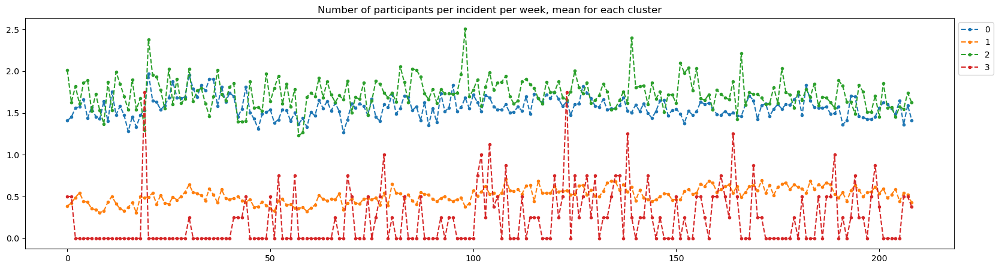

In [306]:
plt.figure(figsize=(20, 5))
for i in range(4):
    plt.plot(np.mean(X[np.where(hier.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(hier.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

In [307]:
cluster_df['cluster_hierarchical4'] = hier.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1


We visualize clusters on a map:

In [308]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_hierarchical4'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

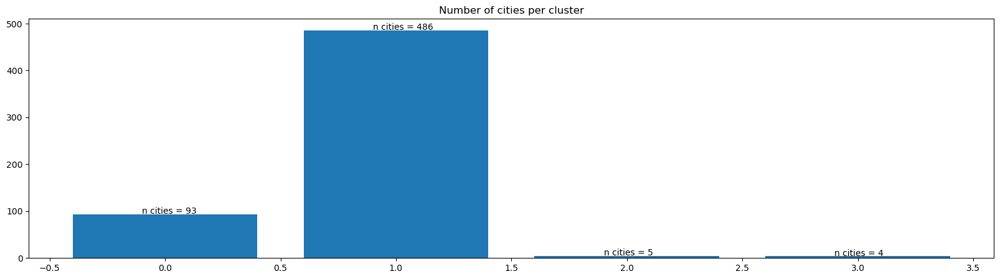

In [309]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_hierarchical4').size().index, cluster_df.groupby('cluster_hierarchical4').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_hierarchical4').size().values):
    plt.text(i-0.1, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

As observed, the majority of cities are clustered into Cluster 1. This clustering is highly imbalanced, with nearly all cities assigned to this single cluster. Such a clustering result may be considered ineffective or uninformative due to its lack of diversity across clusters

Use n_clusters = 6:

In [310]:
hier = AgglomerativeClustering(n_clusters=6, linkage='average')
hier.fit(M)

AgglomerativeClustering(linkage='average', n_clusters=6)

Visualize average of time series for each clusters:

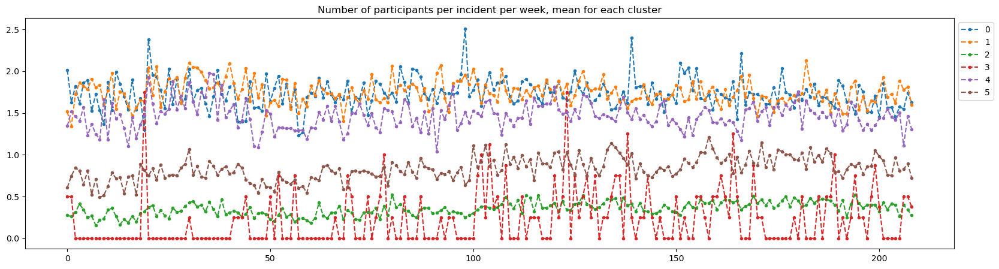

In [311]:
plt.figure(figsize=(20, 5))
for i in range(6):
    plt.plot(np.mean(X[np.where(hier.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(hier.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

In [312]:
cluster_df['cluster_hierarchical6'] = hier.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4,cluster_hierarchical6
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1,5
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1,5


We visualize clusters on a map:

In [313]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_hierarchical6'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

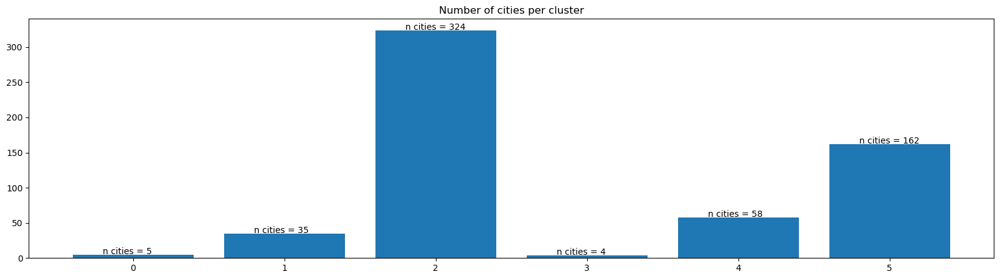

In [314]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_hierarchical6').size().index, cluster_df.groupby('cluster_hierarchical6').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_hierarchical6').size().values):
    plt.text(i-0.2, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

Visualize how the population and the total number of incidents over the four years are distributed across clusters.

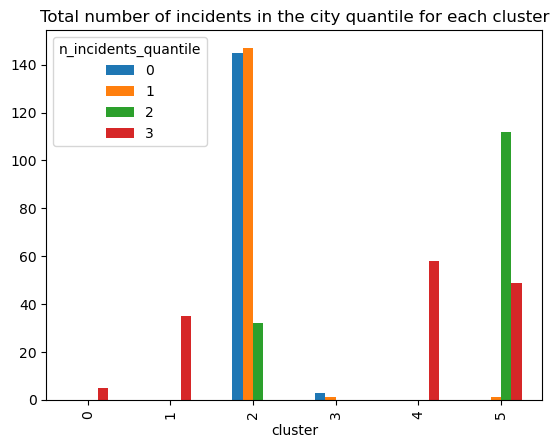

In [315]:
hier_crosstab = pd.crosstab(hier.labels_, cities_df['n_incidents_quantile'], rownames=['cluster'], colnames=['n_incidents_quantile'])
hier_crosstab.plot(kind='bar', stacked=False, title='Total number of incidents in the city quantile for each cluster');

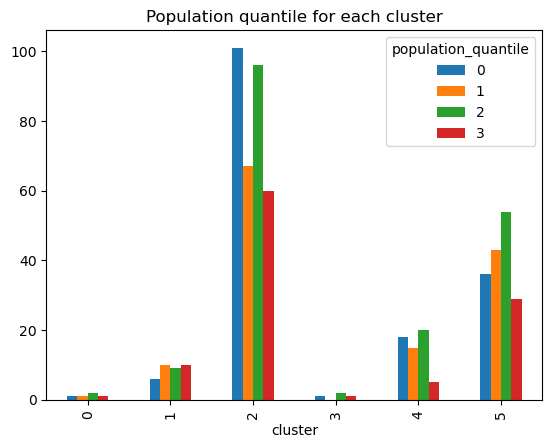

In [316]:
km_crosstab = pd.crosstab(hier.labels_, cities_df['population_quantile'], rownames=['cluster'], colnames=['population_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Population quantile for each cluster');

Performe the same cluster using time series with n_killed in order to compare the results.

In [317]:
hier = AgglomerativeClustering(n_clusters=6, linkage='average')
X = incidents_killed_by_city_df.values
hier.fit(pairwise_distances(X.reshape(X.shape[0], X.shape[1]), metric=cdm_dist))
cluster_df['cluster_hierarchical6_killed'] = hier.labels_

In [318]:
sankey_plot(
    [cluster_df['cluster_hierarchical6'], cluster_df['cluster_hierarchical6_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison HierarchicalClustering'
)

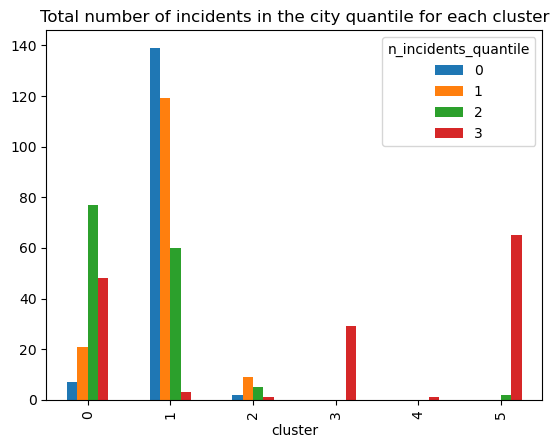

In [319]:
km_crosstab = pd.crosstab(hier.labels_, cities_df['n_incidents_quantile'], rownames=['cluster'], colnames=['n_incidents_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Total number of incidents in the city quantile for each cluster');

#### K-means using Piecewise Aggregate Approximation of time series

Piecewise Aggregate Approximation (PAA) is a technique used in time series analysis to reduce the dimensionality of a time series while preserving its essential characteristics.

PAA approximates a time-series $X$ of length $n$ into vector $\hat{X}=(\hat{x}_1,…,\hat{x}_M)$
 of any arbitrary length  $M\leq n$
 
$x_i = \frac{M}{n} \sum_{j=\frac{M}{n}(i-1)+1}^{\frac{M}{n}i} X_j$

We use PiecewiseAggregateApproximation from tslearn libraty.

In [320]:
n_paa_segments = 100
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(incidents_by_city_df.values) # PAA transformation

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\utils\utils.py:90: UserWarning:

2-Dimensional data passed. Assuming these are 588 1-dimensional timeseries



Visualize the PAA representation of time series:

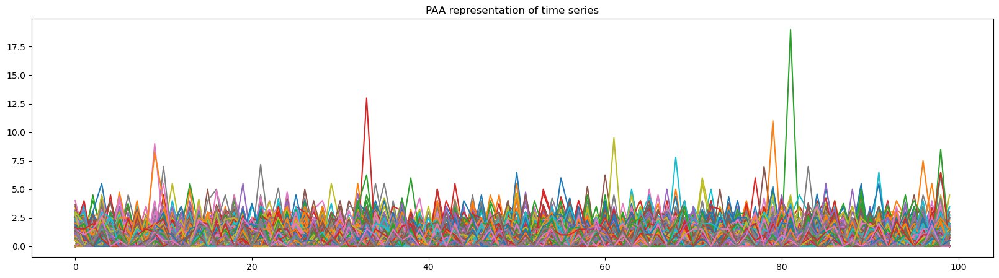

In [321]:
plt.figure(figsize=(20, 5))
plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.title('PAA representation of time series');

Performe k-means clusternig on the PAA representation of time series, unsing the same paramters that in the previously experiment.

In [322]:
km = TimeSeriesKMeans(n_clusters=11, metric="dtw", max_iter=100, random_state=0)
km.fit(X_paa)

TimeSeriesKMeans(max_iter=100, metric='dtw', n_clusters=11, random_state=0)

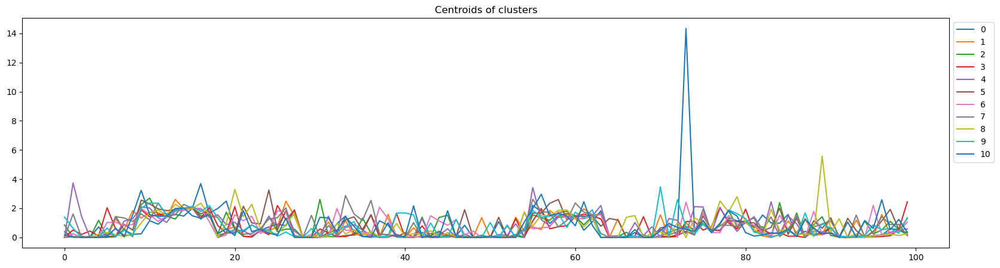

In [323]:
plt.figure(figsize=(20, 5))
plt.plot(km.cluster_centers_.reshape(X_paa.shape[1], 11))
plt.title('Centroids of clusters')
plt.legend(range(11), loc='upper left', bbox_to_anchor=(1, 1));

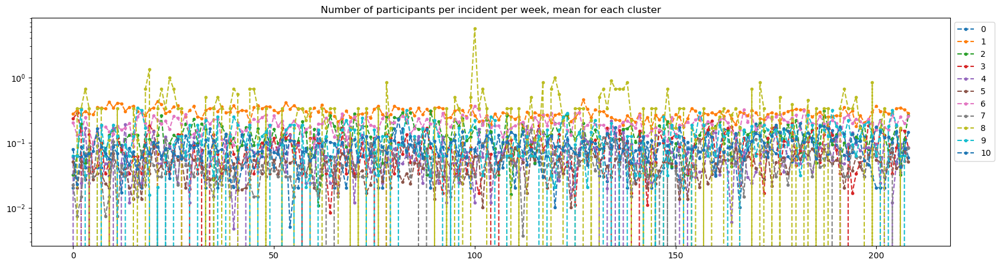

In [324]:
plt.figure(figsize=(20, 5))
for i in range(11):
    plt.plot(np.mean(X[np.where(km.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.yscale('log')
plt.legend(incidents_by_city_df.groupby(km.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

In [325]:
cluster_df['cluster_kmeans_paa'] = km.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4,cluster_hierarchical6,cluster_hierarchical6_killed,cluster_kmeans_paa
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1,5,0,10
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1,5,1,10


In [326]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_kmeans_paa'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

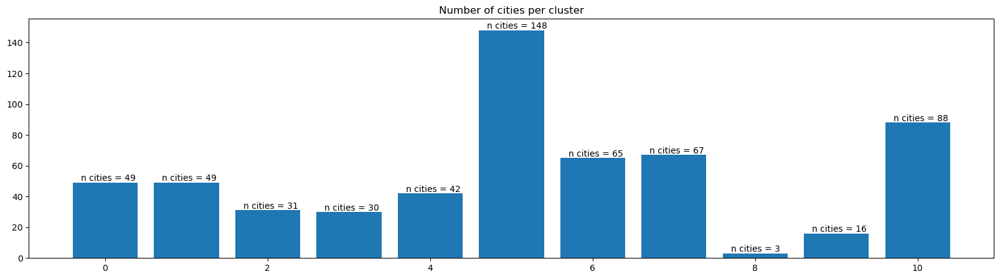

In [327]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_kmeans_paa').size().index, cluster_df.groupby('cluster_kmeans_paa').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_kmeans_paa').size().values):
    plt.text(i-0.3, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

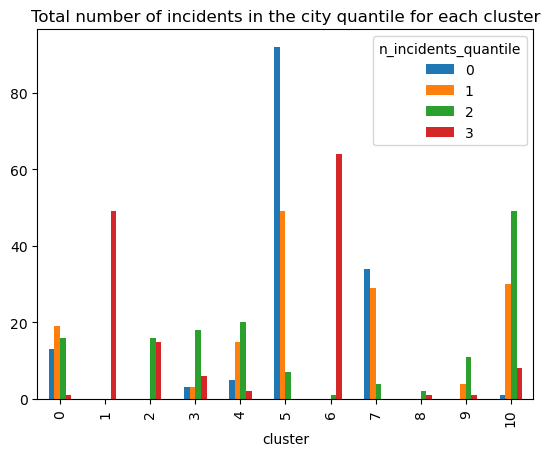

In [328]:
km_crosstab = pd.crosstab(km.labels_, cities_df['n_incidents_quantile'], rownames=['cluster'], colnames=['n_incidents_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Total number of incidents in the city quantile for each cluster');

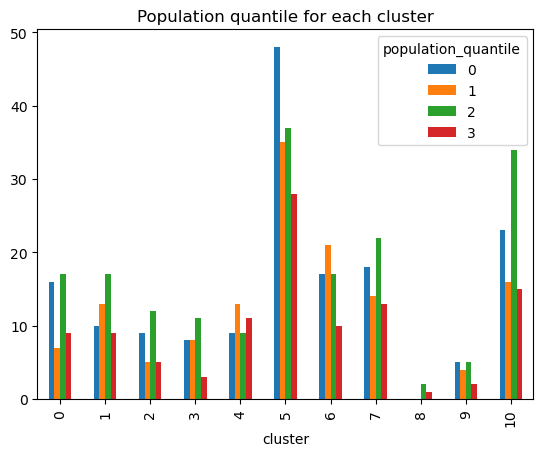

In [329]:
km_crosstab = pd.crosstab(km.labels_, cities_df['population_quantile'], rownames=['cluster'], colnames=['population_quantile'])
km_crosstab.plot(kind='bar', stacked=False, title='Population quantile for each cluster');

(6, 2)


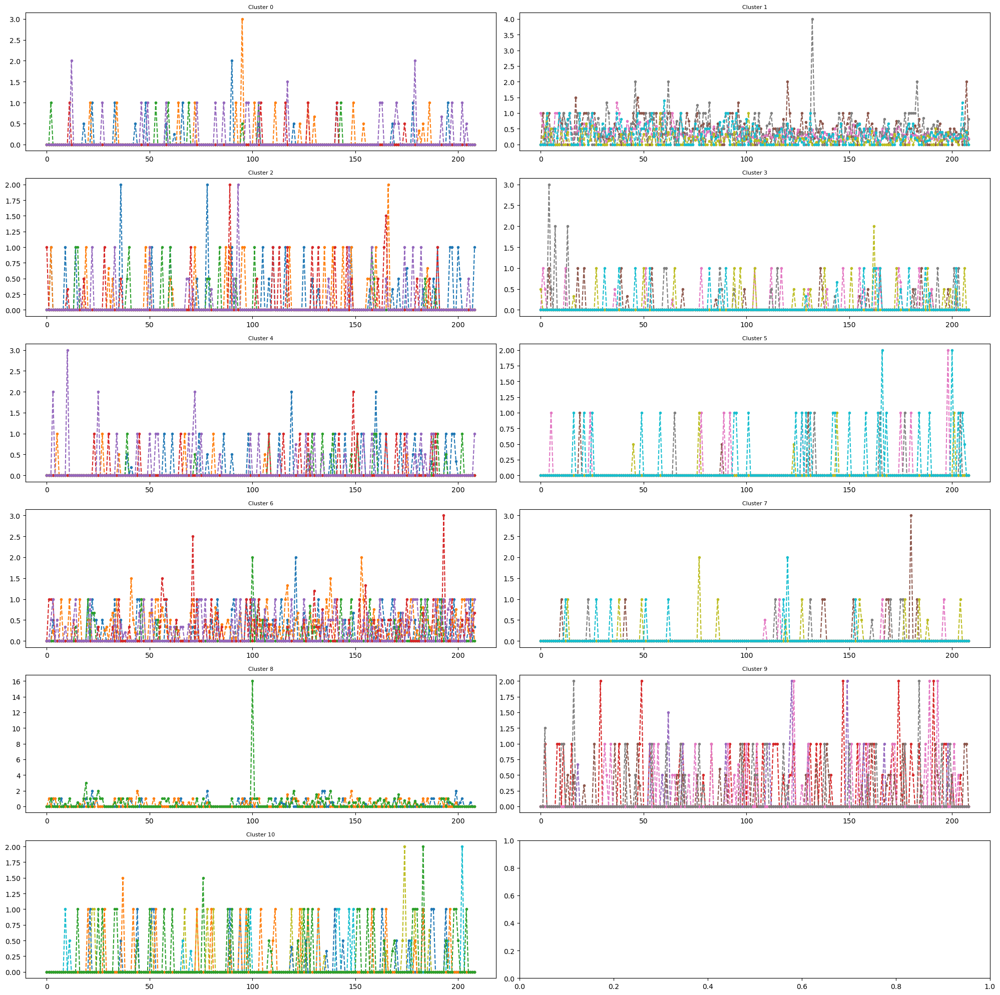

In [332]:
plot_timeseries_per_cluster(km.labels_)

In [333]:
paa = PiecewiseAggregateApproximation(n_segments=100)
X_paa = paa.fit_transform(incidents_killed_by_city_df.values) # PAA transformation
km = TimeSeriesKMeans(n_clusters=11, metric="dtw", max_iter=5, random_state=0)
km.fit(X_paa)
cluster_df['cluster_kmeans_paa_killed'] = km.labels_

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\utils\utils.py:90: UserWarning:

2-Dimensional data passed. Assuming these are 588 1-dimensional timeseries



In [334]:
sankey_plot(
    [cluster_df['cluster_kmeans_paa'], cluster_df['cluster_kmeans_paa_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison KMeansTimeSeries PAA'
)

### Clustering comparison

In [335]:
sankey_plot(
    [cluster_df['cluster_kmeans'], cluster_df['cluster_kmeans_paa'], cluster_df['cluster_hierarchical6'], 
    cluster_df['cluster_hierarchical4']],
    labels_titles=['TimeSeriesKMeans', 'TimeSeriesKMeans PAA', 'Hierarchical (6 clusters)', 'Hierarchical (4 clusters)'],
    title='Clusterings comparison'
)

## Matrix profile

The matrix profile is constructed by combining distance profiles for all possible subsequence pairs in the time series. It highlights repeated patterns or motifs by identifying low values in the matrix profile.

Compute and visualize matrix profile (a data structure that annotates time series by using a sliding window to compare the pairwise distance among the subsequences) for New York, Los Angeles and Chicago:

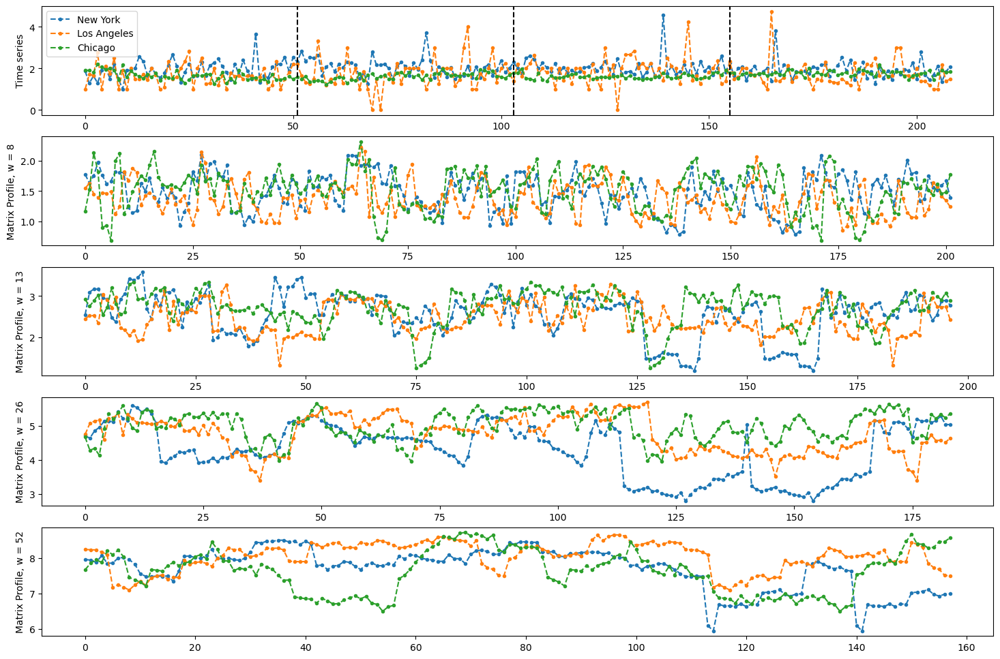

In [336]:
# estrapolate time series for new york, los angeles and chicago
new_york_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'City of New York')].values[0]
los_angeles_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Los Angeles')].values[0]
chicago_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Chicago')].values[0]

w_list = [8, 13, 26, 52] # length of subsequence to compare: two month, quarter, half year, year

fig, ax = plt.subplots(5, 1, figsize=(18, 12))
ax[0].plot(new_york_ts, '.--', label='New York')
ax[0].plot(los_angeles_ts, '.--', label='Los Angeles')
ax[0].plot(chicago_ts, '.--', label='Chicago')
ax[0].set_ylabel('Time series', size=10)
ax[0].axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
ax[0].legend()

for i, w in enumerate(w_list):
    mp, mpi = matrixProfile.stomp(new_york_ts, w)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(los_angeles_ts, w)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(chicago_ts, w)
    ax[i+1].plot(mp, '.--')
    ax[i+1].set_ylabel('Matrix Profile, w = ' + str(w), size=10)

Matrix profile for the whole dataset:

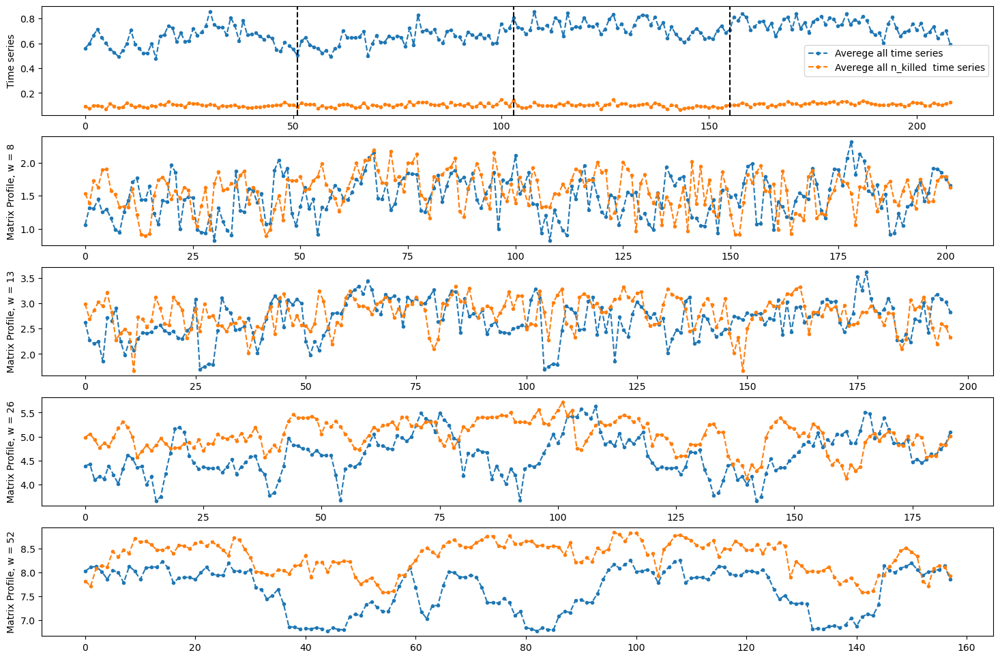

In [337]:
w_list = [8, 13, 26, 52] # length of subsequence to compare: two month, quarter, half year, year

fig, ax = plt.subplots(5, 1, figsize=(18, 12))
ax[0].plot(incidents_by_city_df.mean().values, '.--', label='Averege all time series')
ax[0].plot(incidents_killed_by_city_df.mean().values, '.--', label='Averege all n_killed  time series')
ax[0].set_ylabel('Time series', size=10)
ax[0].axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
ax[0].legend()

for i, w in enumerate(w_list):
    mp, mpi = matrixProfile.stomp(incidents_by_city_df.mean().values, w)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(incidents_killed_by_city_df.mean().values, w)
    ax[i+1].plot(mp, '.--')
    ax[i+1].set_ylabel('Matrix Profile, w = ' + str(w), size=10)

##  Motifs extraction

Parameters
- max_motifs: stop finding new motifs once we have max_motifs
- radius: For each motif found, find neighbors that are within radius*motif_mp of the first.
- n_neighbors: number of neighbors from the first to find. If it is None, find all.
- ex_zone: minimum distance between indices for after each subsequence is identified. Defaults to m/2 where m is the subsequence length. If ex_zone = 0, only the found index is exclude, if ex_zone = 1 then if idx is found as a motif idx-1, idx, idx+1 are excluded.


The function returns a tuple (top_motifs, distances) which are lists of the same length.

- top_motifs: This is a list of the indices found for each motif. The first index is the nth motif followed by all nearest neighbors found sorted by distances.
- distances: Minimum Matrix profile value for each motif set.

In [338]:
w = 13 # use matrix profile with window = 13 weeks (quarter of year)
mp, mpi = matrixProfile.stomp(new_york_ts, w)

In [339]:
mo, mod  = motifs.motifs(new_york_ts, (mp, mpi), max_motifs=5)

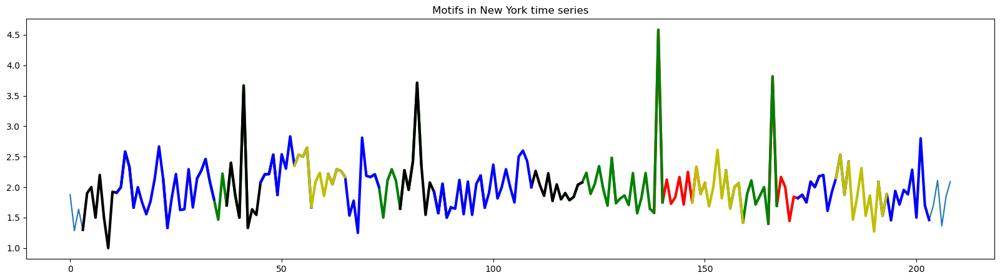

In [340]:
plt.figure(figsize=(20, 5))
plt.plot(new_york_ts)
colors = ['r', 'g', 'k', 'b', 'y'][:len(mo)]
for m, d, c in zip(mo, mod, colors):
    for i in m:
        m_shape = new_york_ts[i:i+w]
        plt.plot(range(i,i+w), m_shape, color=c, lw=3)
plt.title('Motifs in New York time series');

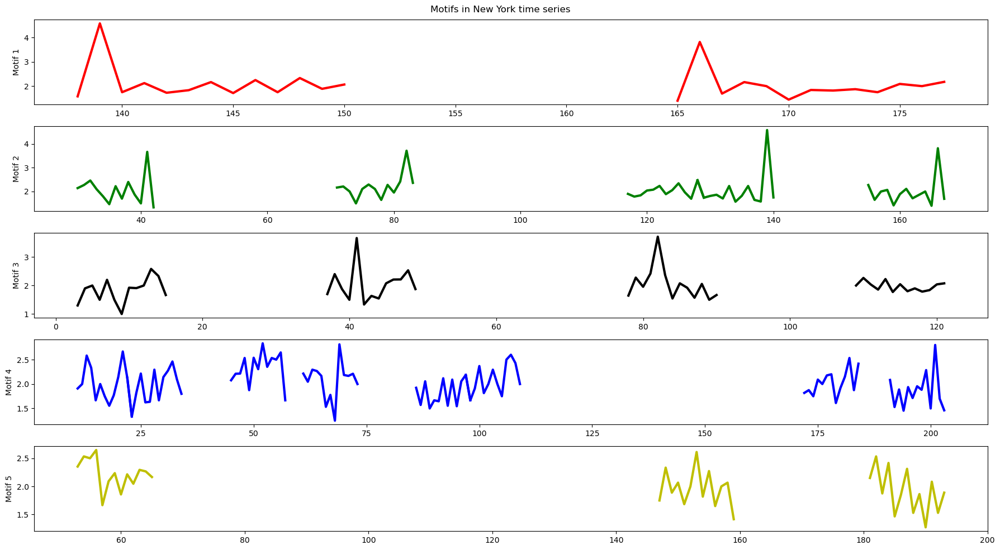

In [341]:
fig, ax = plt.subplots(len(mo), 1, figsize=(18, 10))
for j, (m, d, c) in enumerate(zip(mo, mod, colors)):
    for i in m:
        m_shape = new_york_ts[i:i+w]
        ax[j].plot(range(i,i+w), m_shape, color=c, lw=3)
        ax[j].set_ylabel('Motif ' + str(j+1), size=10)
plt.suptitle('Motifs in New York time series')
plt.tight_layout();

## Anomalies extraction

Parameters  
- mp: matrix profile numpy array
- k: the number of discords to discover
- ex_zone: the number of samples to exclude and set to Inf on either side of a found discord   


Returns a list of indexes represent the discord starting locations. MaxInt indicates there were no more discords that could be found due to too many exclusions or profile being too small. Discord start indices are sorted by highest matrix profile value.

In [342]:
anoms = discords(mp, ex_zone=15, k=10)

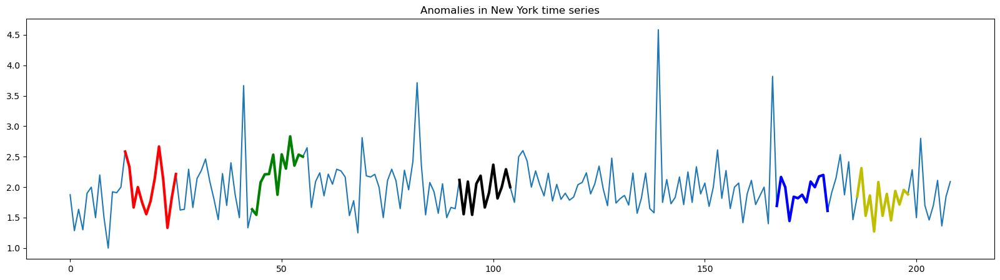

In [343]:
plt.figure(figsize=(20, 5))
plt.plot(new_york_ts)
colors = ['r', 'g', 'k', 'b', 'y'][:len(mo)]
for a, c in zip(anoms, colors):
    a_shape = new_york_ts[a:a+w]
    plt.plot(range(a, a+w), a_shape, color=c, lw=3)
plt.title('Anomalies in New York time series');

## Shaplet discovery

Create binary var is_killed:

In [345]:
cities_df['n_killed'].describe()

count     588.000000
mean       53.602041
std       130.666975
min         1.000000
25%        10.000000
50%        18.000000
75%        39.000000
max      1980.000000
Name: n_killed, dtype: float64

In [346]:
is_killed = cities_df['n_killed'].apply(lambda x: 1 if x > np.quantile(cities_df['n_killed'], 0.5) else 0)

In [347]:
print('Number of cities with n_killed over second quantile: ', np.sum(is_killed))
print('Number of cities with n_killed in first or second quantile: ', len(is_killed) - np.sum(is_killed))

Number of cities with n_killed over second quantile:  291
Number of cities with n_killed in first or second quantile:  297


In [348]:
X = incidents_by_city_df.values
y = is_killed

In [349]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, stratify=y)

In [350]:
n_ts, ts_sz = X_train.shape[0], X_train.shape[1]
n_classes = len(set(y))

shapelet_sizes = grabocka_params_to_shapelet_size_dict(n_ts=n_ts, ts_sz=ts_sz,
    n_classes=n_classes, l=0.1, r=1)
print('n_ts', n_ts)
print('ts_sz', ts_sz)
print('n_classes', n_classes)
print('shapelet_sizes', shapelet_sizes)

n_ts 470
ts_sz 209
n_classes 2
shapelet_sizes {20: 4}


In [351]:
shp_clf = ShapeletModel(n_shapelets_per_size=shapelet_sizes, optimizer="sgd",
    weight_regularizer=.01, max_iter=200, verbose=1)

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.



In [352]:
shp_clf.fit(X_train, y_train)

Epoch 1/200
2/2 [==============================] - 1s 11ms/step - loss: 1.1743 - binary_accuracy: 0.4957 - binary_crossentropy: 1.1533
Epoch 2/200
2/2 [==============================] - 0s 12ms/step - loss: 1.1591 - binary_accuracy: 0.4957 - binary_crossentropy: 1.1383
Epoch 3/200
2/2 [==============================] - 0s 8ms/step - loss: 1.1440 - binary_accuracy: 0.4957 - binary_crossentropy: 1.1236
Epoch 4/200
2/2 [==============================] - 0s 6ms/step - loss: 1.1293 - binary_accuracy: 0.4957 - binary_crossentropy: 1.1091
Epoch 5/200
2/2 [==============================] - 0s 13ms/step - loss: 1.1149 - binary_accuracy: 0.4957 - binary_crossentropy: 1.0950
Epoch 6/200
2/2 [==============================] - 0s 6ms/step - loss: 1.1009 - binary_accuracy: 0.4957 - binary_crossentropy: 1.0813
Epoch 7/200
2/2 [==============================] - 0s 8ms/step - loss: 1.0872 - binary_accuracy: 0.4957 - binary_crossentropy: 1.0679
Epoch 8/200
2/2 [==============================] - 0s 0s/st

LearningShapelets(max_iter=200, n_shapelets_per_size={20: 4}, verbose=1,
                  weight_regularizer=0.01)

In [353]:
predicted_labels = shp_clf.predict(X_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels))
predicted_locations = shp_clf.locate(X_train)

1/1 [==============================] - 0s 105ms/step
Correct classification rate: 0.7033898305084746
2/2 [==============================] - 0s 9ms/step


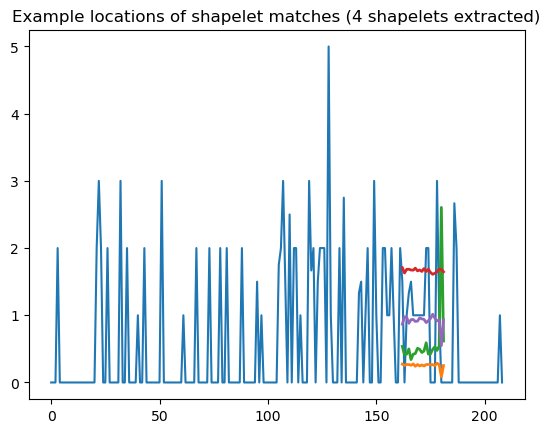

In [354]:
ts_id = 0
plt.figure()
n_shapelets = sum(shapelet_sizes.values())
plt.title(f"""Example locations of shapelet matches ({n_shapelets} shapelets extracted)""")

plt.plot(X[ts_id].ravel())
for idx_shp, shp in enumerate(shp_clf.shapelets_):
    t0 = predicted_locations[ts_id, idx_shp]
    plt.plot(np.arange(t0, t0 + len(shp)), shp, linewidth=2)